In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown
from scipy.stats import pearsonr, spearmanr, ks_2samp, mannwhitneyu, ttest_ind

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils import resample

from utilities import threshold, data

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

## Load predictions

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov4_allmodels_cal.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 128 entries, PatientID to NoduleType
dtypes: bool(27), float64(86), int64(11), object(4)
memory usage: 12.8+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v4_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
nlst_preds = data.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=False, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5911 entries, 0 to 10182
Columns: 122 entries, PatientID to NoduleType
dtypes: bool(27), float64(82), int64(11), object(2)
memory usage: 4.5+ MB


In [5]:
MODEL_TO_COL = {
    "Venkadesh": "DL_cal",
    # "de Haas Combined": "Thijmen_mean_cal",
    "de Haas Local": "Thijmen_local_cal",
    # "de Haas Global (hidden nodule)": "Thijmen_global_hidden_cal",
    "de Haas Global (w/nodule)": "Thijmen_global_show_cal",
    "Sybil year 1": "sybil_year1",
    # "Sybil year 2": "sybil_year2",
    # "Sybil year 3": "sybil_year3",
    # "Sybil year 4": "sybil_year4",
    # "Sybil year 5": "sybil_year5",
    # "Sybil year 6": "sybil_year6",
    "PanCan2b": "PanCan2b",
}

## Pick threshold policies

In [ ]:
policies = (
    ("Sensitivity", 0.9),
    # ("Sensitivity", 1.0),
    ("Specificity", 0.9),
    # ("Specificity", 1.0),
    # ("Youden J", 1.0),  ## Max J statistic
)

policy_threshold_df = threshold.get_threshold_policies(nlst_preds, models=MODEL_TO_COL, policies=policies, brock=True)
policy_threshold_df

,Sensitivity=0.9,Specificity=0.9,Youden J=1.0,Brock
Venkadesh,0.048,0.219,0.112,0.06
de Haas Local,0.045,0.212,0.144,0.06
de Haas Global (w/nodule),0.068,0.300,0.131,0.06
Sybil year 1,0.003,0.057,0.017,0.06
PanCan2b,0.015,0.165,0.035,0.06


Save thresholds.

In [7]:
policy_threshold_df['col'] = policy_threshold_df.apply(lambda x: MODEL_TO_COL[x.name], axis=1)
policy_threshold_df.to_csv(f"{NLST_PREDS}/policy-thresholds-{len(nlst_preds)}.csv", index=True)
policy_threshold_df.drop(columns=['col'], inplace=True)

## Plot results by category

In [18]:
def plot_by_category(df, cat, metrics_to_plot=['fpr', 'fnr'], diff=True):
    display(Markdown(f"### {cat}"))
    stats = threshold.plot_threshold_stats_subgroups(
        df, cat, policy_threshold_df,
        models=MODEL_TO_COL,
        plot_metrics=metrics_to_plot,
        diff=diff, show_all=False,
        min_mal=10,
    )

### race

,num,pct,mal,ben,pct_mal
1.0,5523,93.435967,530,4993,9.596234
2.0,188,3.180511,28,160,14.893617
3.0,72,1.218068,6,66,8.333333
4.0,23,0.389105,8,15,34.782609
5.0,18,0.304517,1,17,5.555556
6.0,65,1.099645,6,59,9.230769


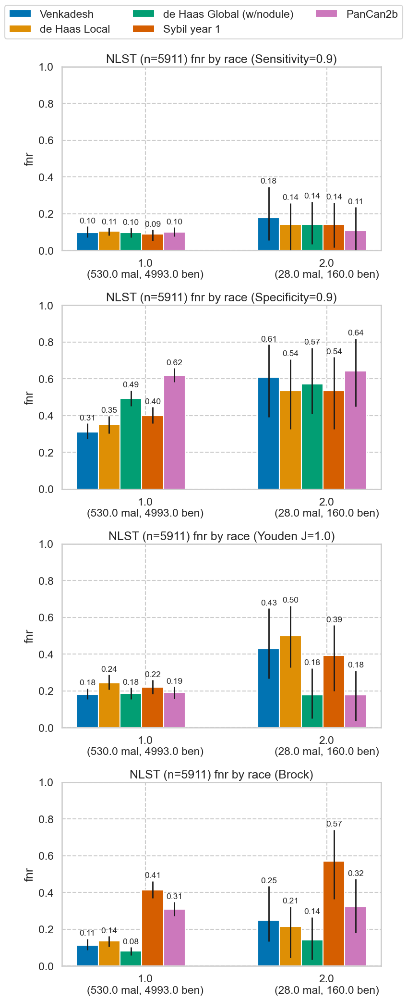

In [19]:
plot_by_category(nlst_preds, 'race', metrics_to_plot=['fnr'], diff=False)

### Included columns (from predictions)

### FamilyHistoryLungCa

,num,pct,mal,ben,pct_mal
False,4384,74.166808,401,3983,9.146898
True,1527,25.833192,180,1347,11.787819


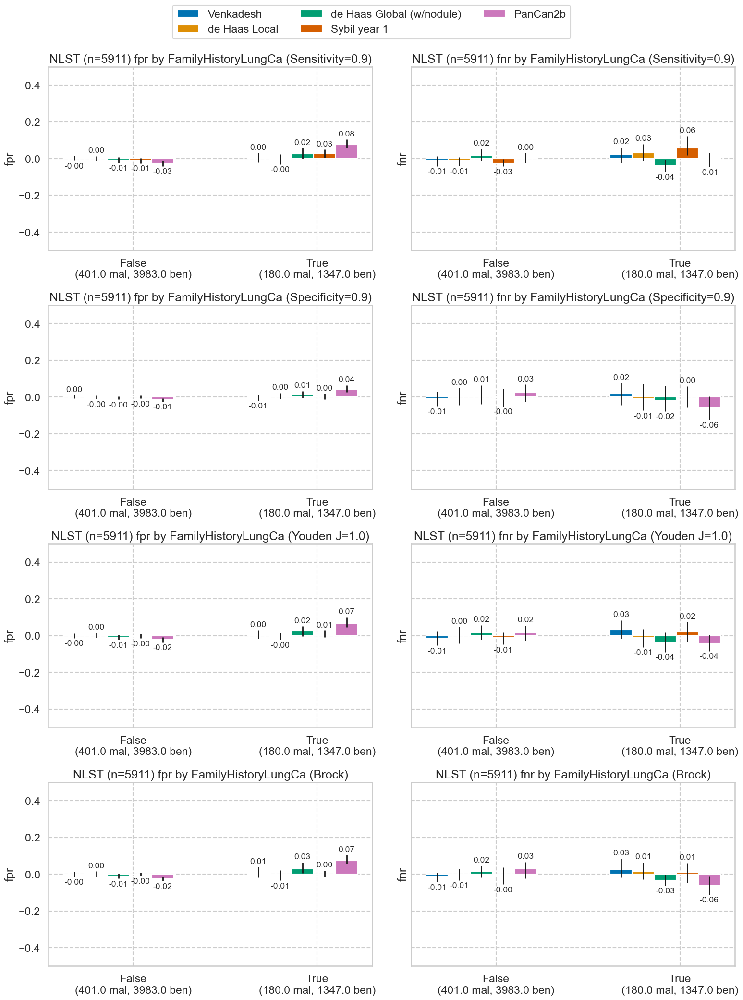

### PersonalCancerHist

,num,pct,mal,ben,pct_mal
False,5638,95.381492,552,5086,9.790706
True,273,4.618508,29,244,10.622711


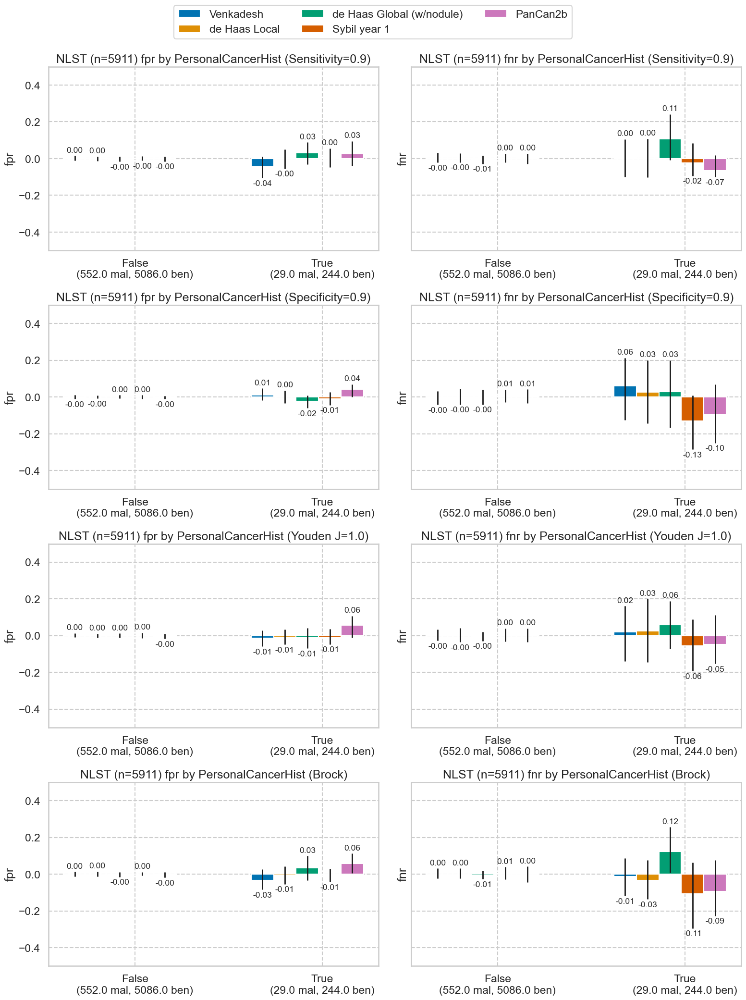

### wrknomask

,num,pct,mal,ben,pct_mal
False,4407,74.555913,442,3965,10.029499
True,1504,25.444087,139,1365,9.242021


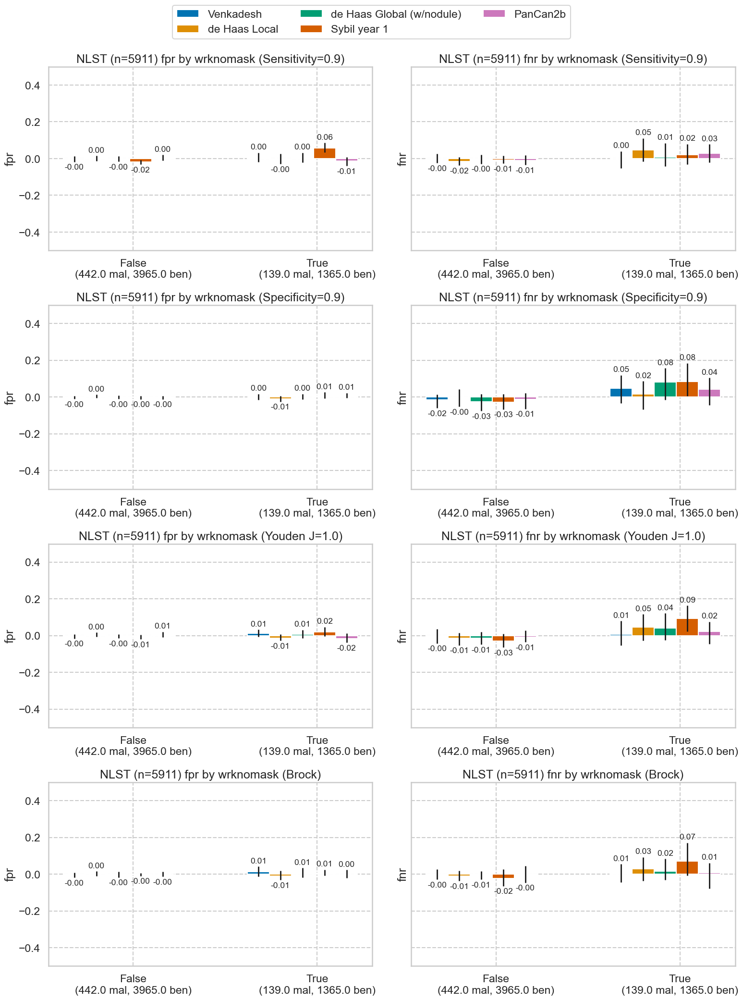

### Emphysema

,num,pct,mal,ben,pct_mal
False,3755,63.52563,317,3438,8.442077
True,2156,36.47437,264,1892,12.244898


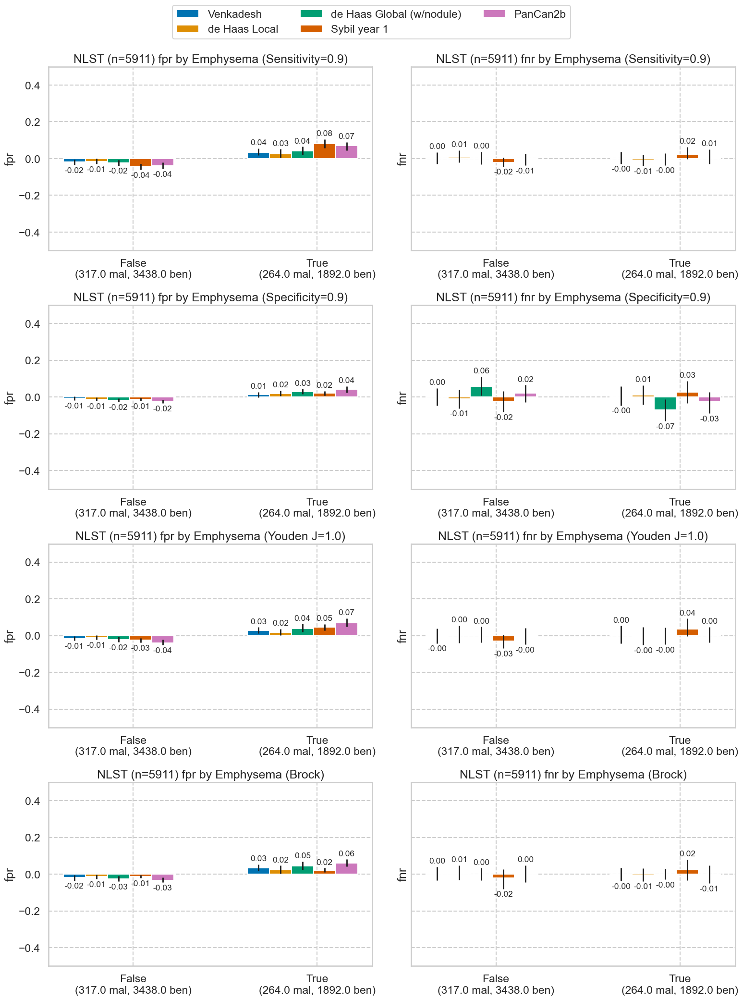

In [20]:
for c in nlst_democols['cat']['other']:
    plot_by_category(nlst_preds, c)

### Nodule information

### GroundGlassOpacity

,num,pct,mal,ben,pct_mal
False,4275,72.322788,581,3694,13.590643
True,1636,27.677212,0,1636,0.000000


### NoduleInUpperLung

,num,pct,mal,ben,pct_mal
False,2850,48.215192,233,2617,8.175439
True,3061,51.784808,348,2713,11.368834


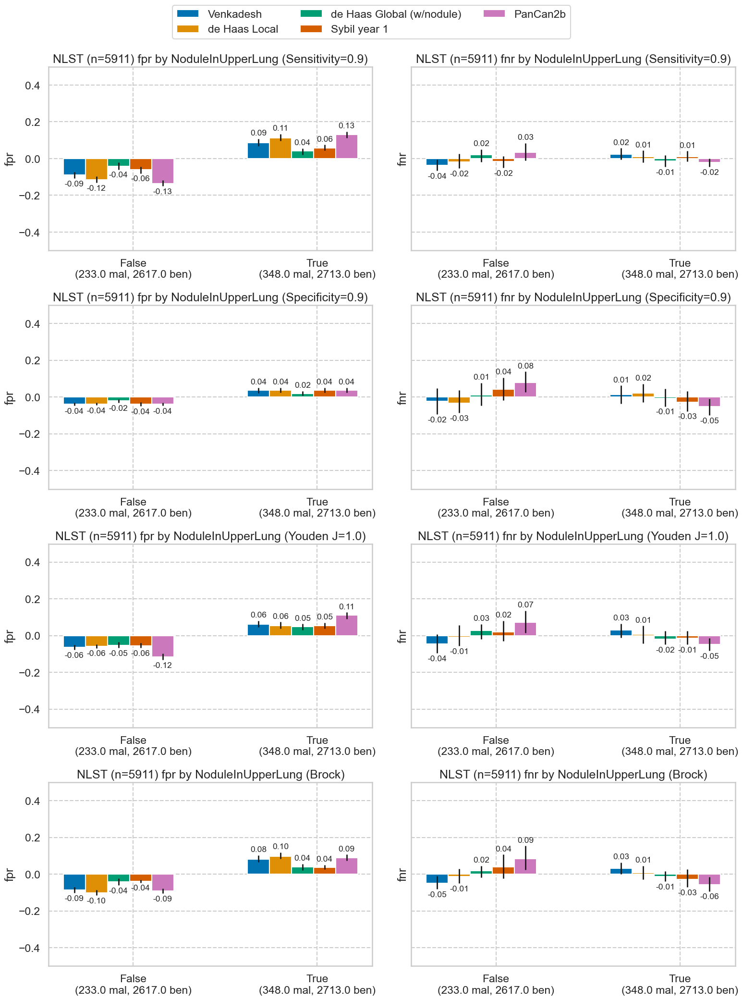

### Perifissural

,num,pct,mal,ben,pct_mal
False,5387,91.135172,581,4806,10.785224
True,524,8.864828,0,524,0.000000


### NonSolid

,num,pct,mal,ben,pct_mal
False,5858,99.103367,528,5330,9.013315
True,53,0.896633,53,0,100.000000


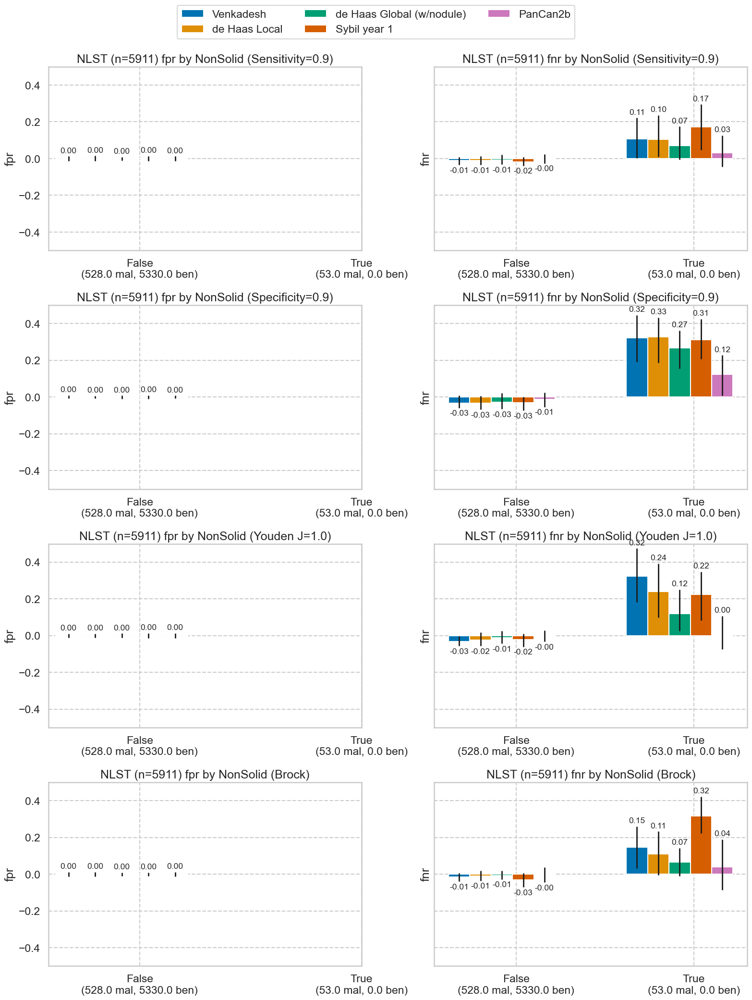

### Calcified

,num,pct,mal,ben,pct_mal
False,5906,99.915412,581,5325,9.837453
True,5,0.084588,0,5,0.000000


### Spiculation

,num,pct,mal,ben,pct_mal
False,5900,99.813906,571,5329,9.677966
True,11,0.186094,10,1,90.909091


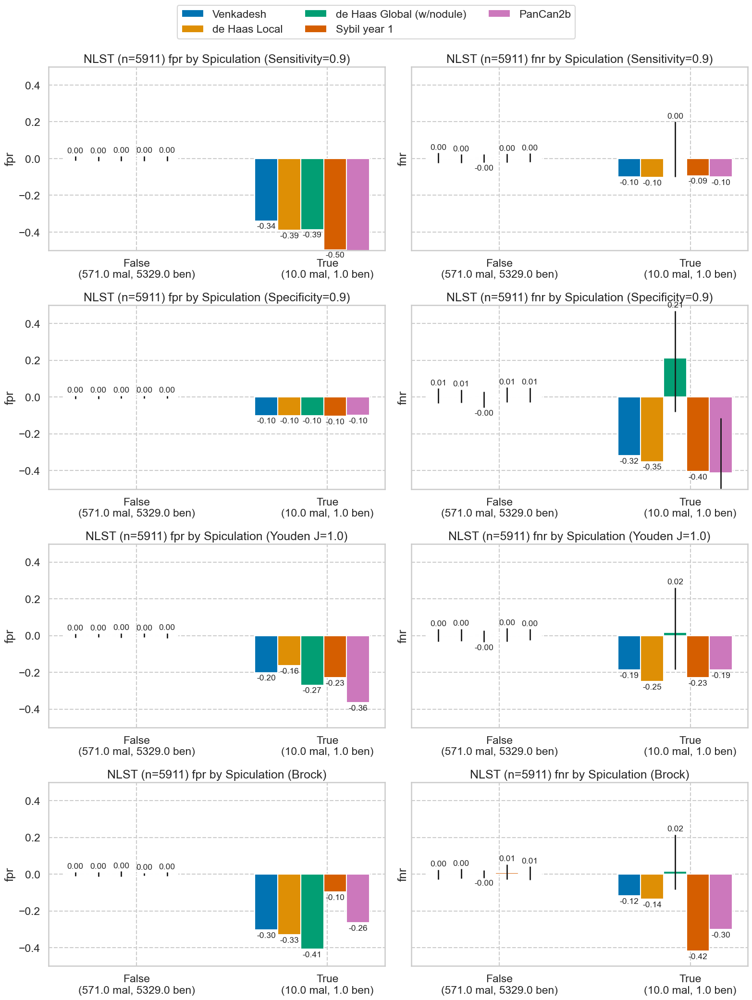

### PartSolid

,num,pct,mal,ben,pct_mal
False,5808,98.257486,478,5330,8.230028
True,103,1.742514,103,0,100.000000


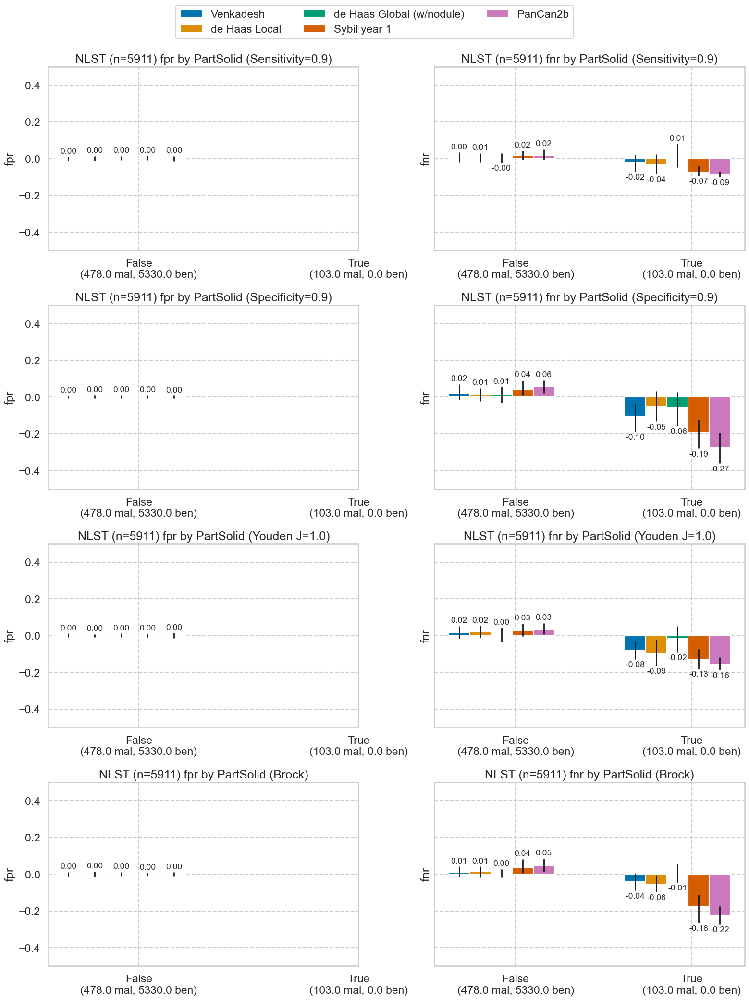

### Solid

,num,pct,mal,ben,pct_mal
False,1911,32.329555,144,1767,7.535322
True,4000,67.670445,437,3563,10.925000


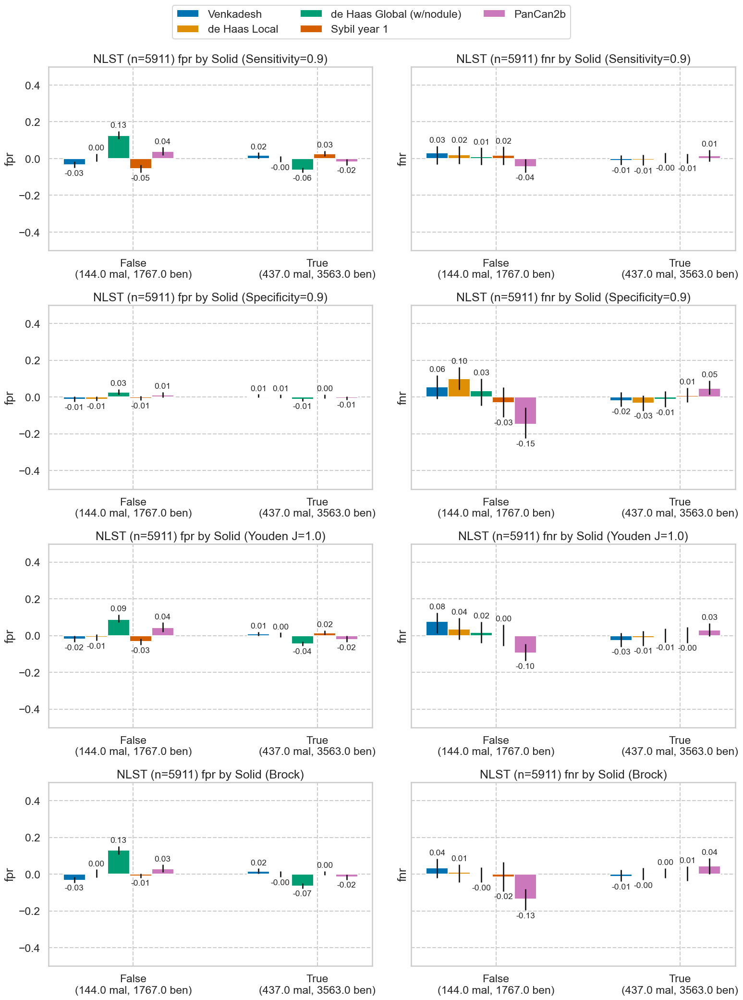

### SemiSolid

,num,pct,mal,ben,pct_mal
False,5159,87.277956,581,4578,11.261872
True,752,12.722044,0,752,0.000000


In [21]:
for cat in nlst_democols['cat']['nodule']:
    plot_by_category(nlst_preds, cat)

### Demographics

### Overweight

,num,pct,mal,ben,pct_mal
False,1899,32.126544,209,1690,11.005793
True,4012,67.873456,372,3640,9.272183


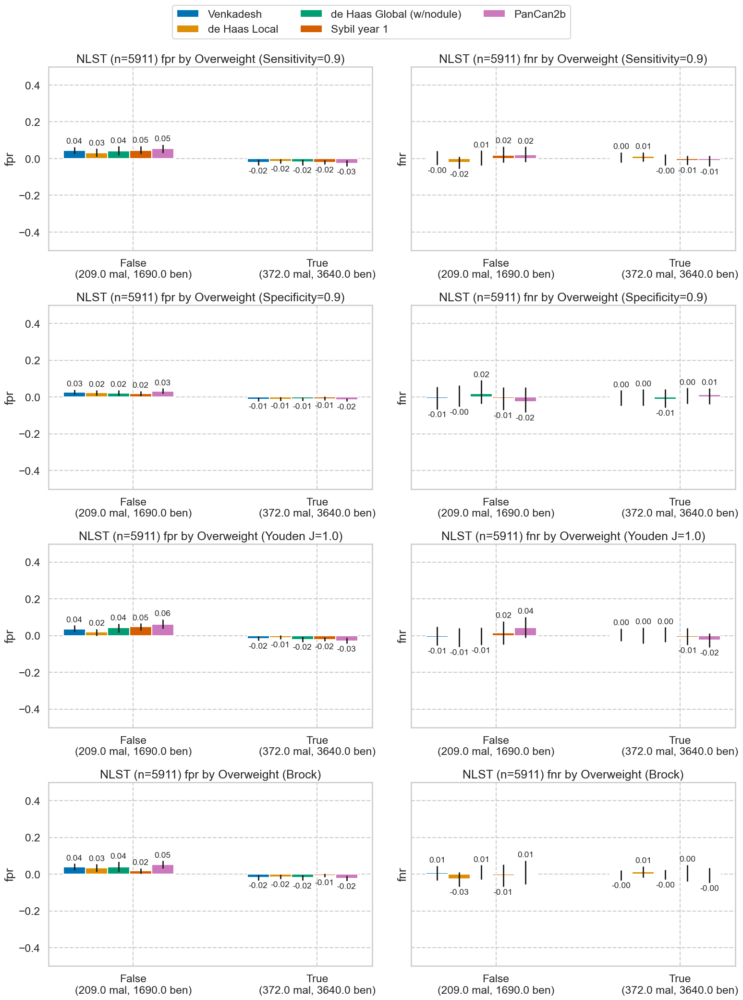

### educat

,num,pct,mal,ben,pct_mal
1.0,111,1.877855,9,102,8.108108
2.0,290,4.906107,32,258,11.034483
3.0,1479,25.021147,141,1338,9.533469
4.0,852,14.413805,87,765,10.211268
5.0,1301,22.009812,126,1175,9.684858
6.0,913,15.445779,96,817,10.514786
7.0,854,14.447640,76,778,8.899297


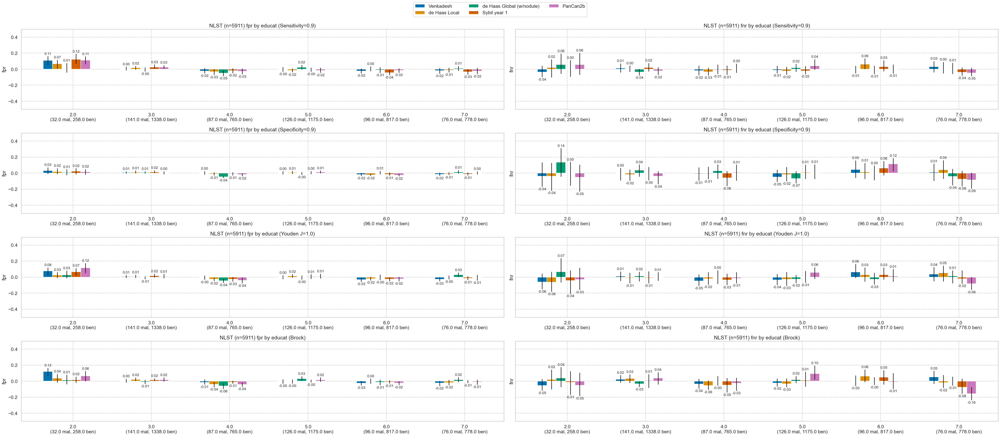

### Gender

,num,pct,mal,ben,pct_mal
1,3441,58.2135,337,3104,9.793665
2,2470,41.7865,244,2226,9.878543


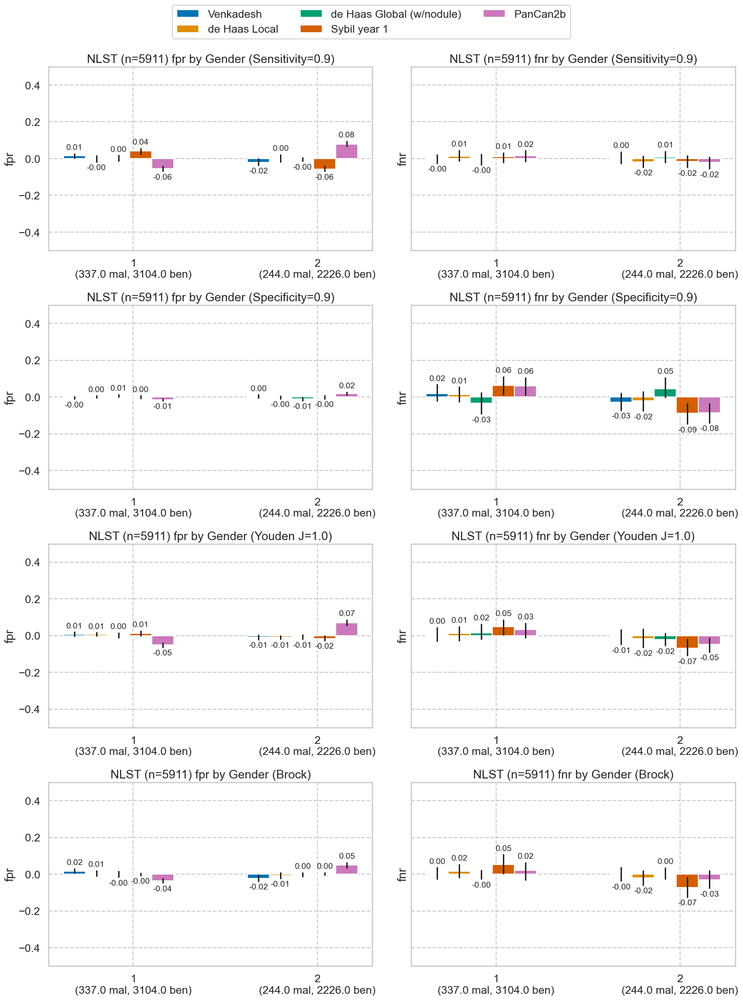

### Married

,num,pct,mal,ben,pct_mal
False,1937,32.769413,197,1740,10.170367
True,3974,67.230587,384,3590,9.662808


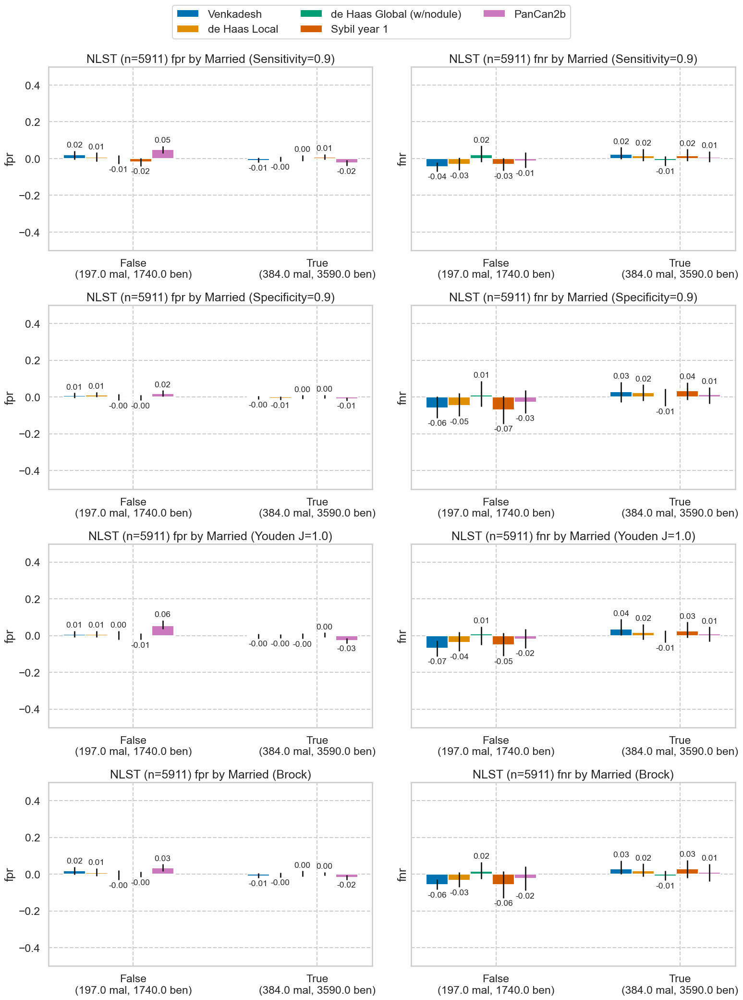

### HighSchoolPlus

,num,pct,mal,ben,pct_mal
False,111,1.877855,9,102,8.108108
True,5800,98.122145,572,5228,9.862069


### NonHispanicWhite

,num,pct,mal,ben,pct_mal
False,481,8.137371,55,426,11.434511
True,5430,91.862629,526,4904,9.686924


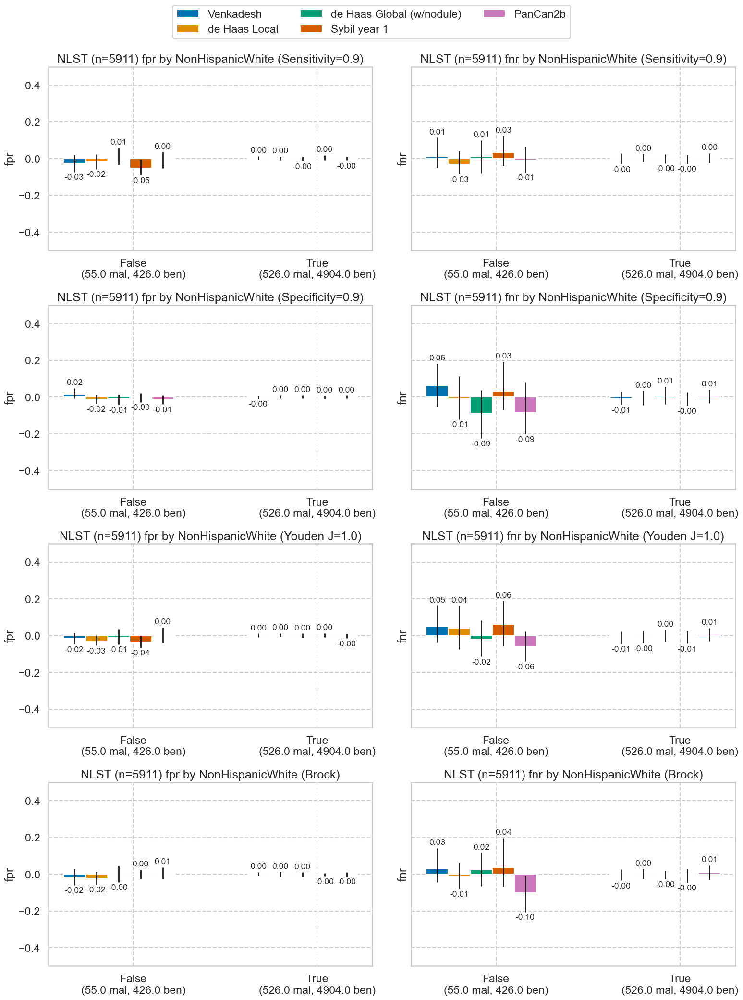

### Unfinished_ed

,num,pct,mal,ben,pct_mal
False,4320,73.084081,423,3897,9.791667
True,1591,26.915919,158,1433,9.930861


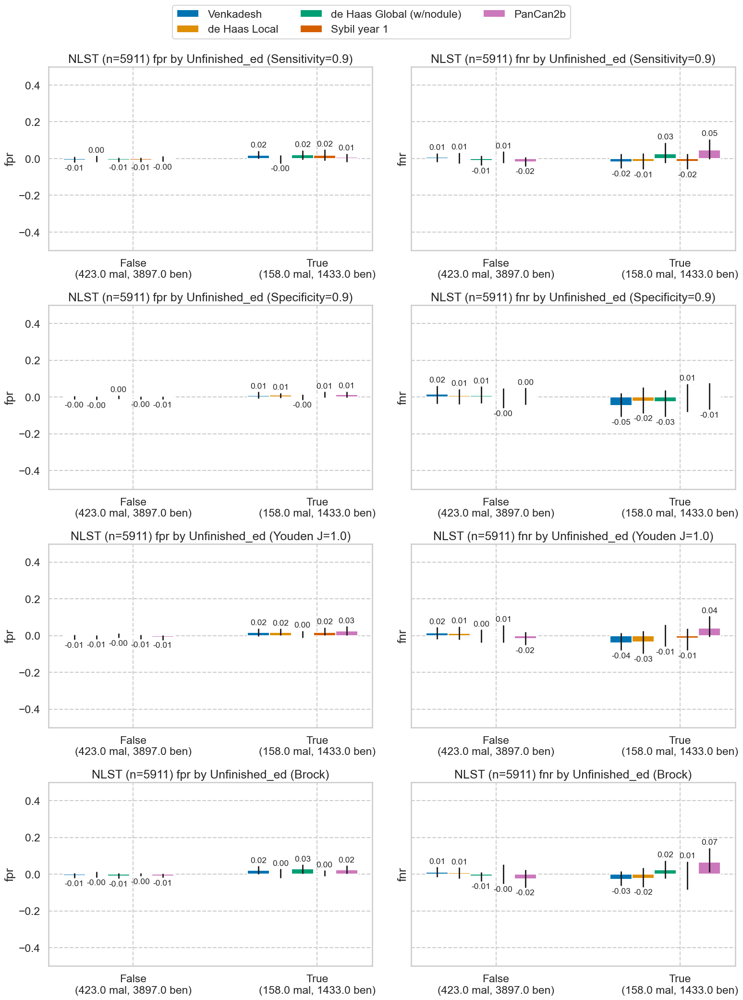

### WhiteOrBlack

,num,pct,mal,ben,pct_mal
1.0,5523,93.435967,530,4993,9.596234
2.0,188,3.180511,28,160,14.893617


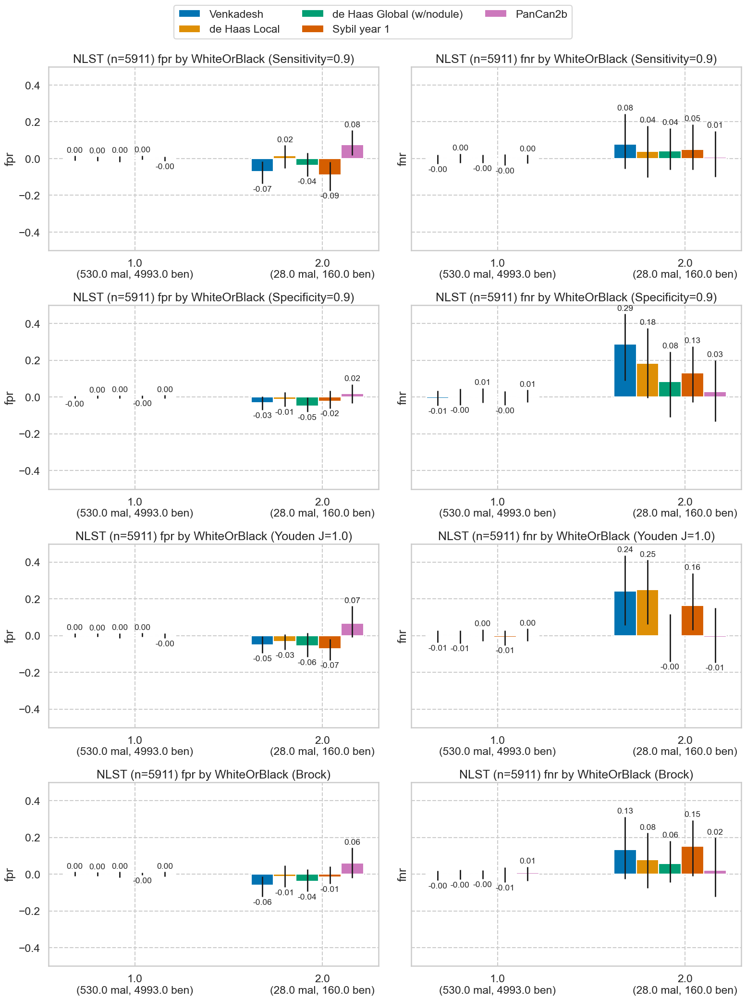

### marital

,num,pct,mal,ben,pct_mal
1.0,229,3.874133,16,213,6.986900
2.0,3974,67.230587,384,3590,9.662808
3.0,507,8.577229,49,458,9.664694
4.0,65,1.099645,5,60,7.692308
5.0,1123,18.998477,125,998,11.130899


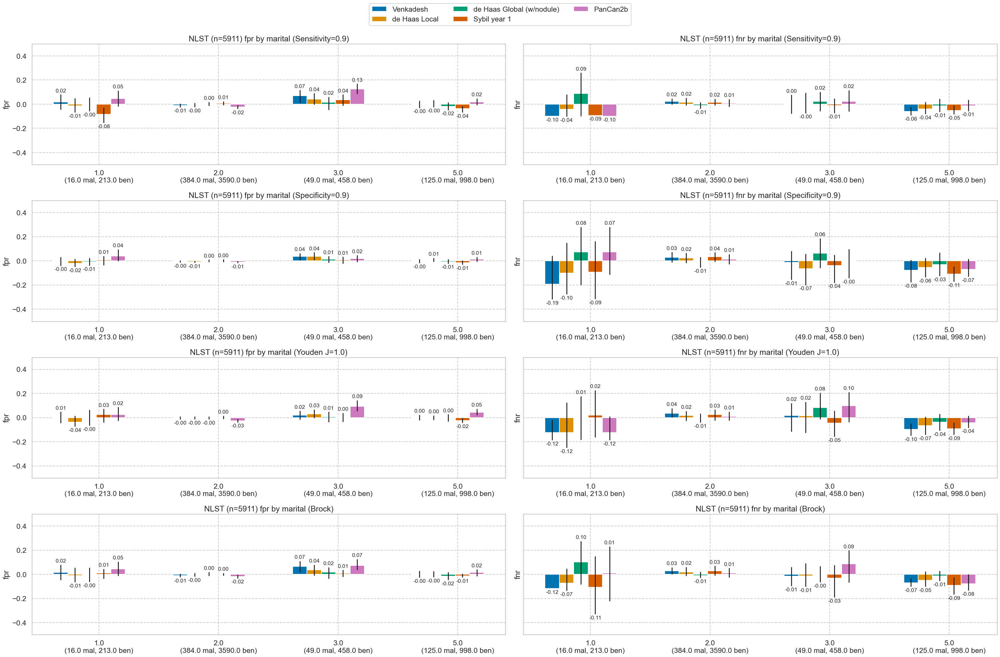

### ethnic

,num,pct,mal,ben,pct_mal
1.0,98,1.657926,4,94,4.081633
2.0,5779,97.766875,574,5205,9.932514


### race

,num,pct,mal,ben,pct_mal
1.0,5523,93.435967,530,4993,9.596234
2.0,188,3.180511,28,160,14.893617
3.0,72,1.218068,6,66,8.333333
4.0,23,0.389105,8,15,34.782609
5.0,18,0.304517,1,17,5.555556
6.0,65,1.099645,6,59,9.230769


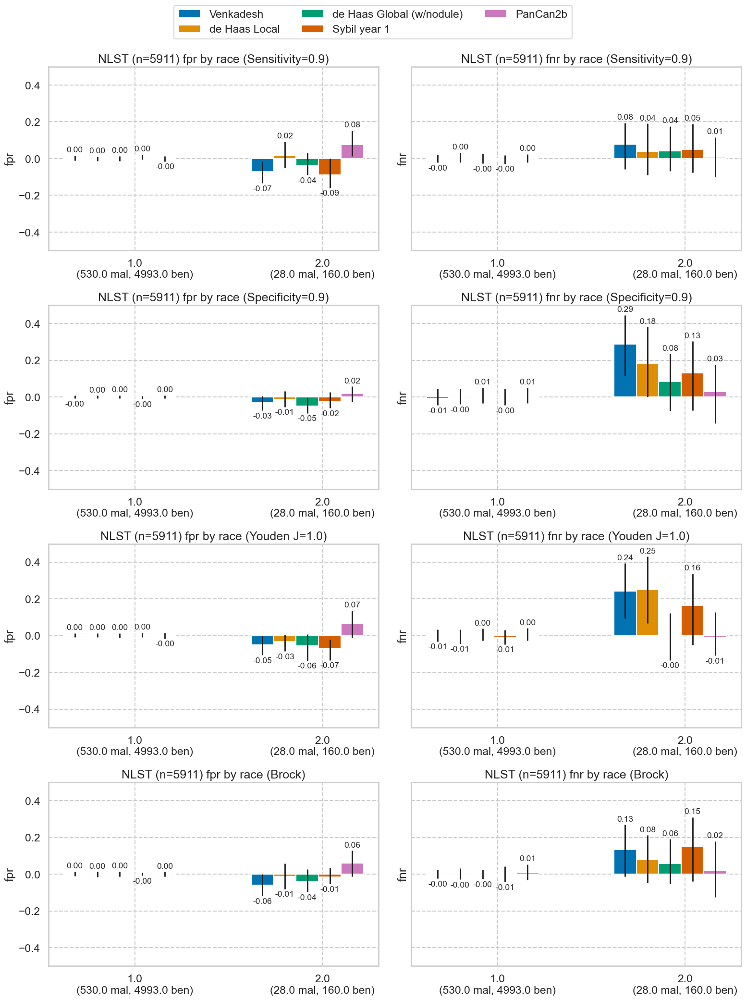

In [22]:
for cat in nlst_democols['cat']['demo']:
    plot_by_category(nlst_preds, cat)

### Smoking

### smokelive

,num,pct,mal,ben,pct_mal
0.0,665,11.250211,64,601,9.62406
1.0,5211,88.157672,514,4697,9.86375


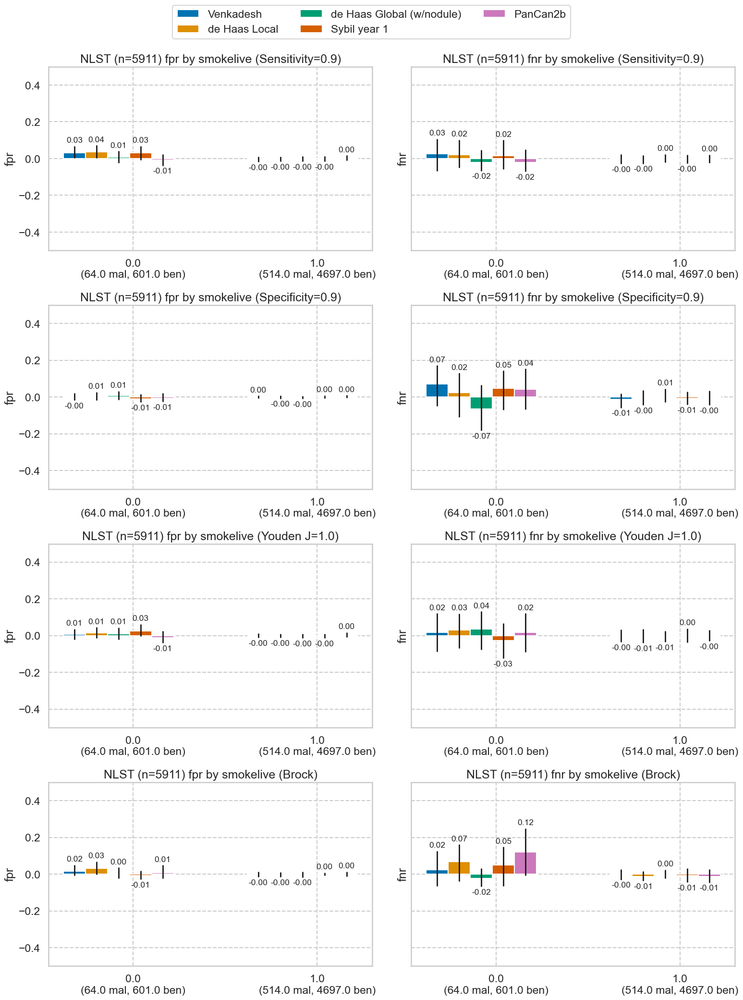

### cigar

,num,pct,mal,ben,pct_mal
0.0,4738,80.155642,470,4268,9.919797
1.0,1148,19.421418,109,1039,9.494774


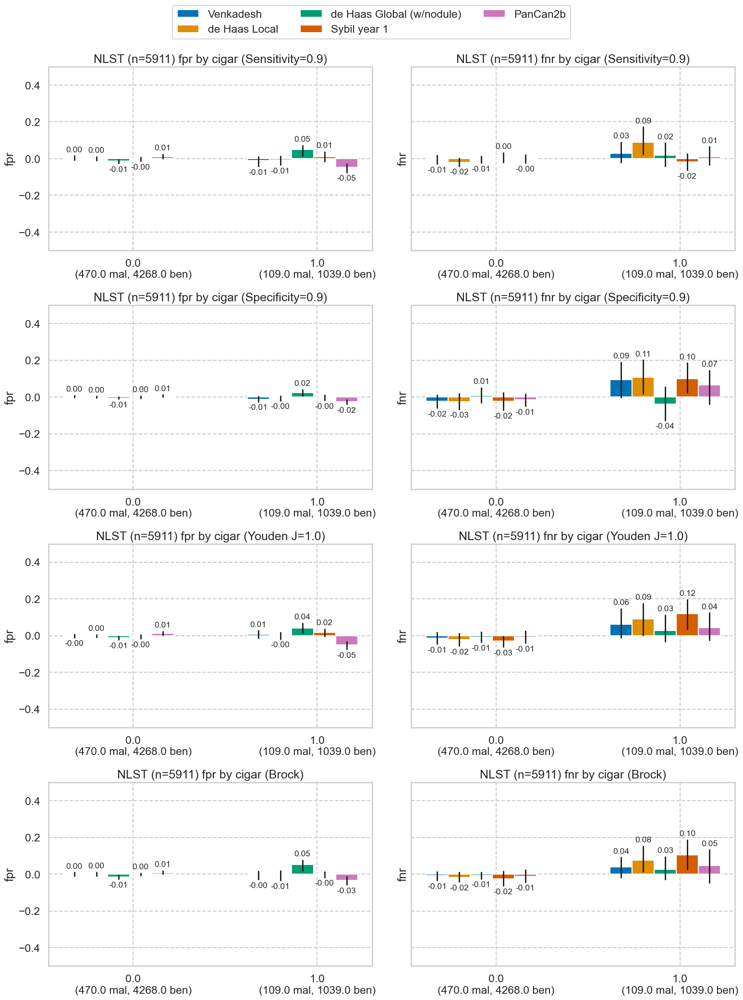

### cigsmok

,num,pct,mal,ben,pct_mal
0,2930,49.568601,267,2663,9.112628
1,2981,50.431399,314,2667,10.533378


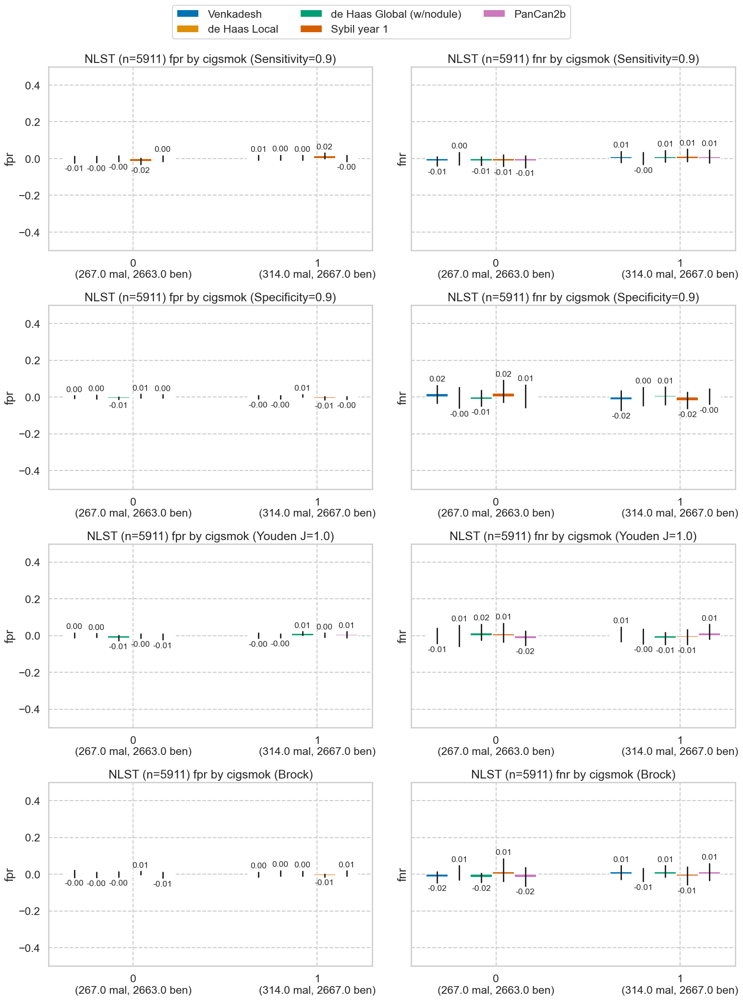

### smokework

,num,pct,mal,ben,pct_mal
0.0,722,12.214515,65,657,9.002770
1.0,5141,86.973439,512,4629,9.959152


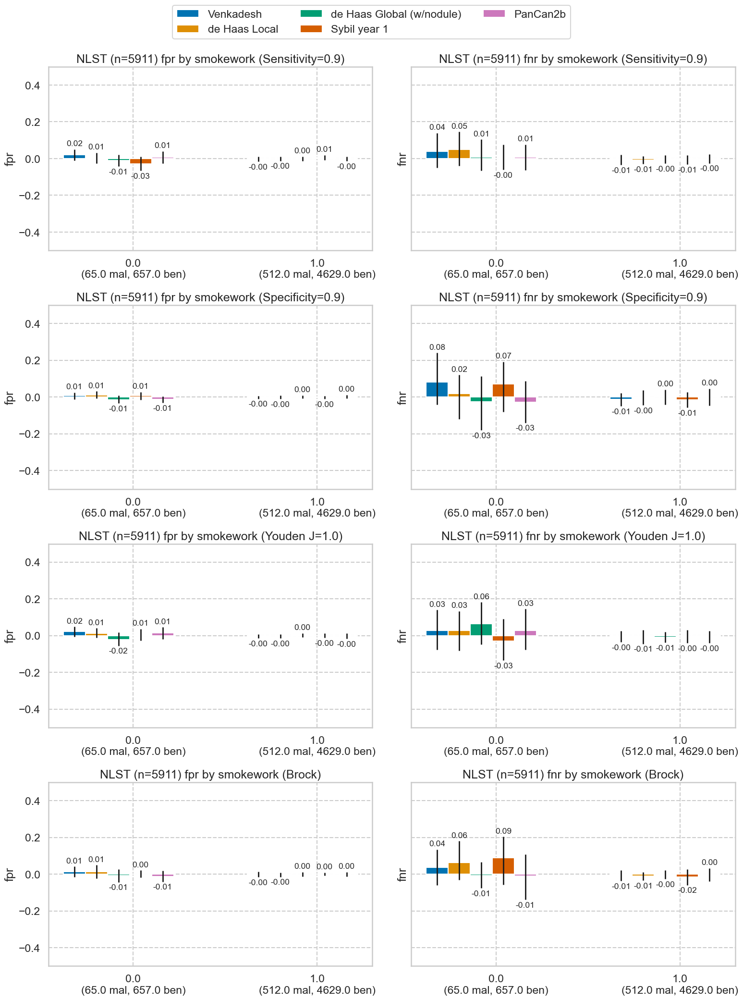

### pipe

,num,pct,mal,ben,pct_mal
0.0,4575,77.398071,436,4139,9.530055
1.0,1301,22.009812,143,1158,10.991545


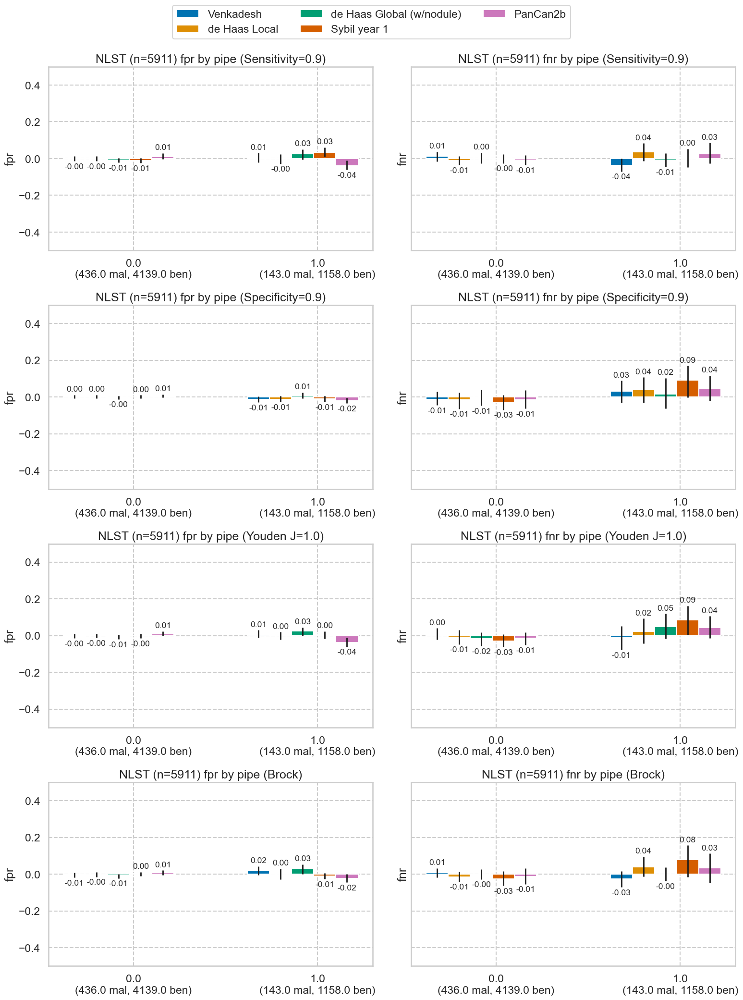

In [23]:
for cat in nlst_democols['cat']['smoke']:
    plot_by_category(nlst_preds, cat)

### Work history

### wrkbaki

,num,pct,mal,ben,pct_mal
0.0,5750,97.276265,560,5190,9.73913
1.0,160,2.706818,20,140,12.50000


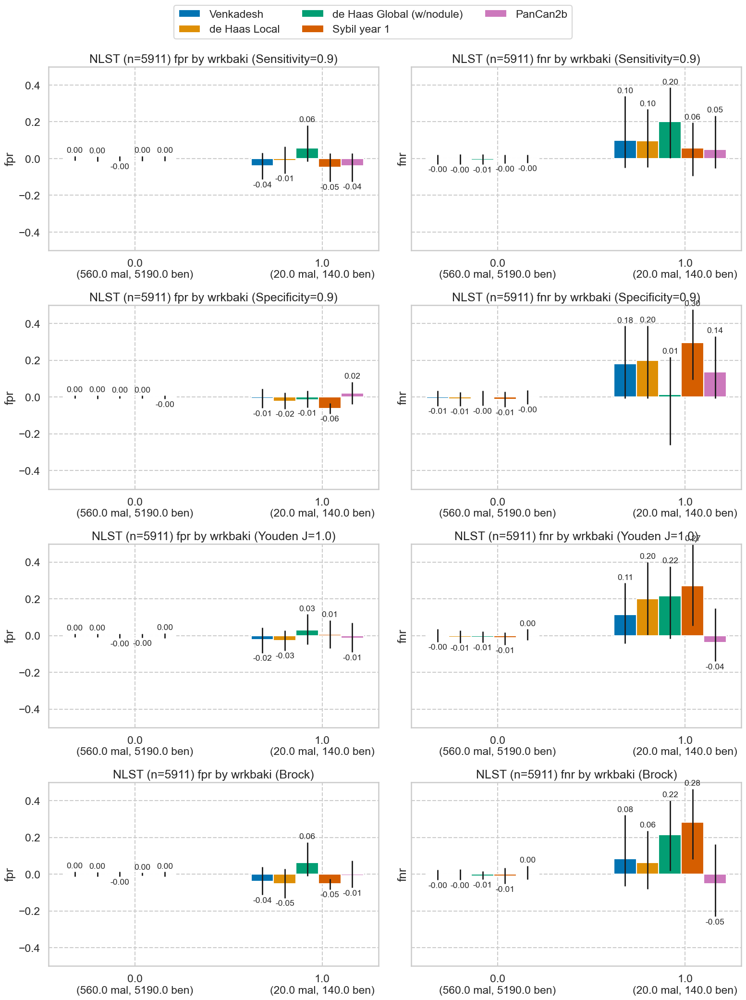

### wrkfoun

,num,pct,mal,ben,pct_mal
0.0,5670,95.922856,545,5125,9.611993
1.0,240,4.060227,35,205,14.583333


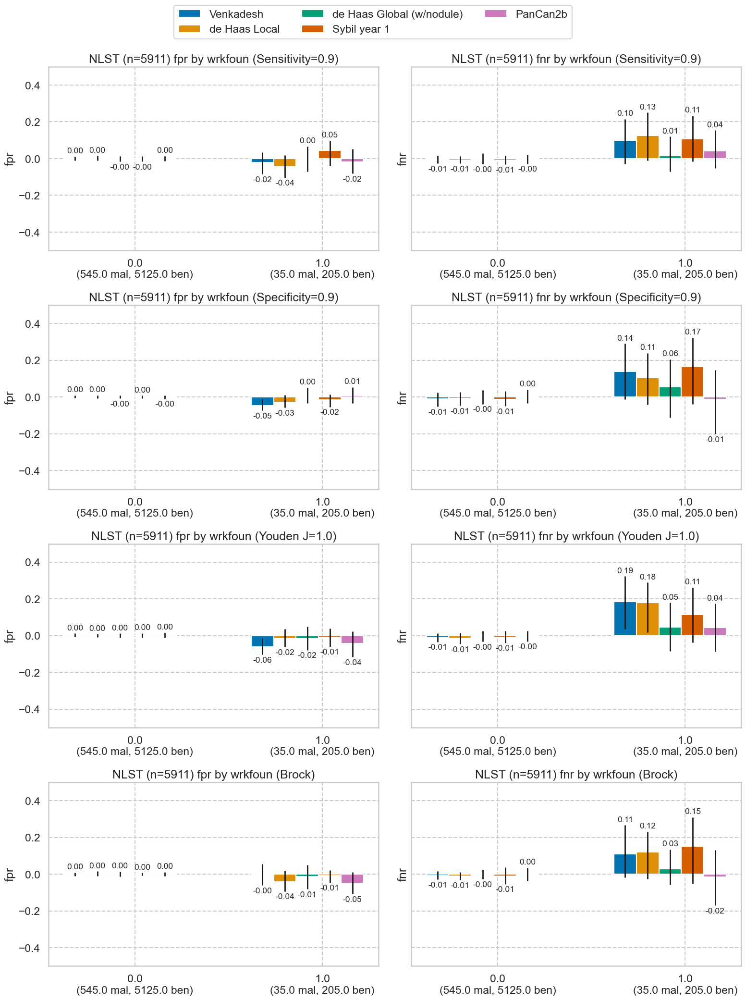

### wrkchem

,num,pct,mal,ben,pct_mal
0.0,5515,93.300626,547,4968,9.918404
1.0,393,6.648621,33,360,8.396947


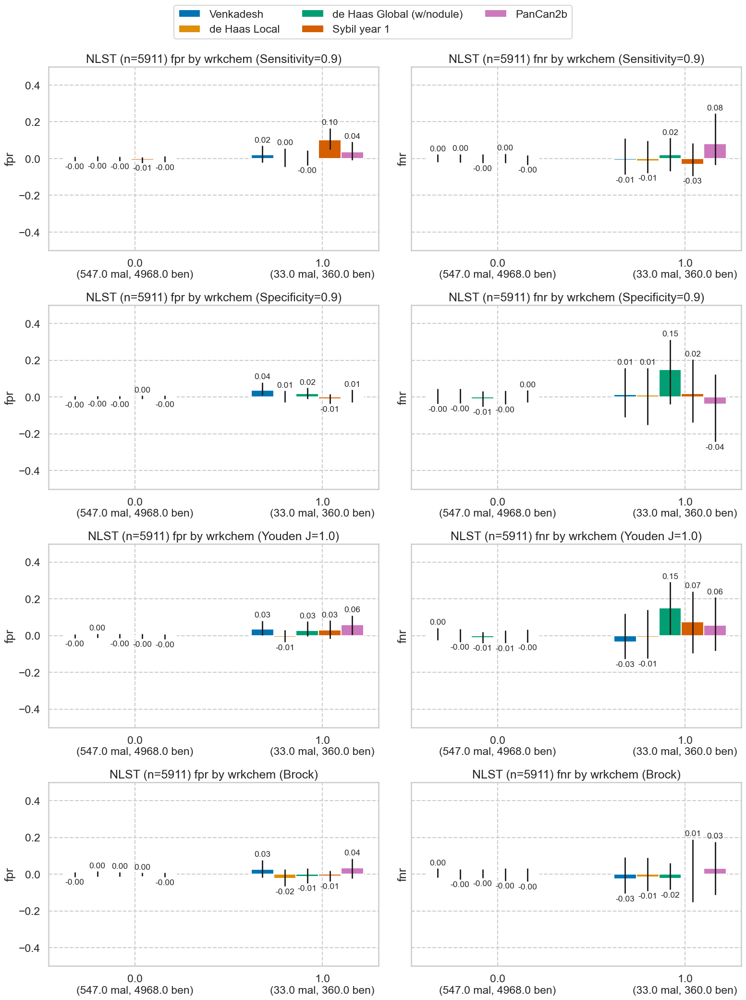

### wrkasbe

,num,pct,mal,ben,pct_mal
0.0,5610,94.907799,541,5069,9.643494
1.0,300,5.075283,39,261,13.000000


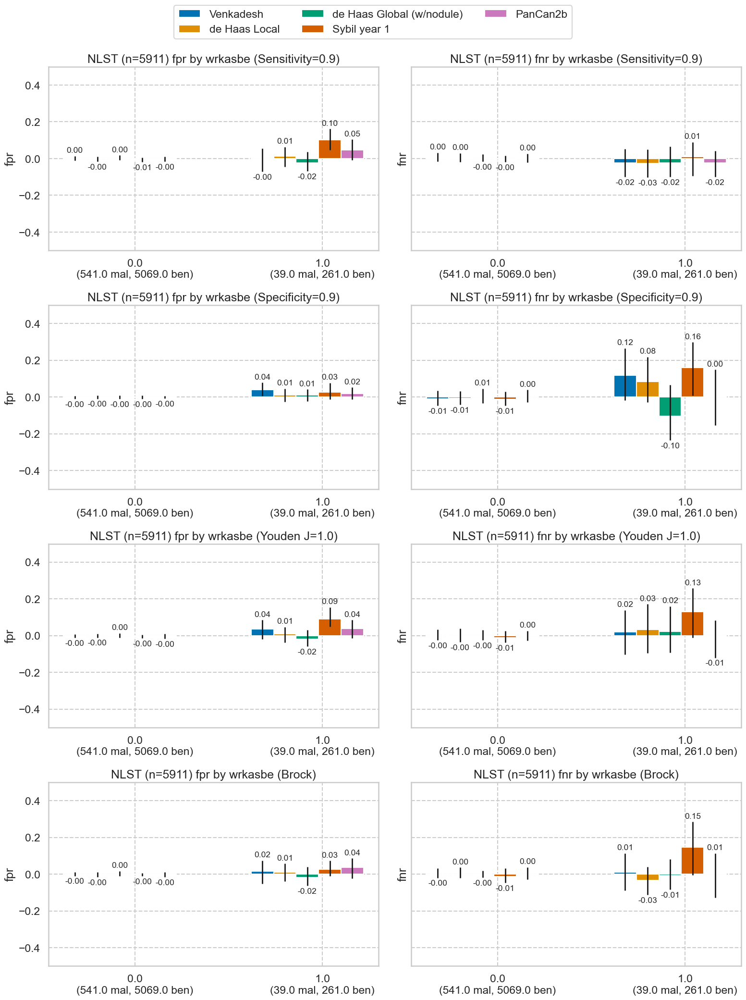

### wrkfire

,num,pct,mal,ben,pct_mal
0.0,5776,97.716122,564,5212,9.764543
1.0,134,2.266960,16,118,11.940299


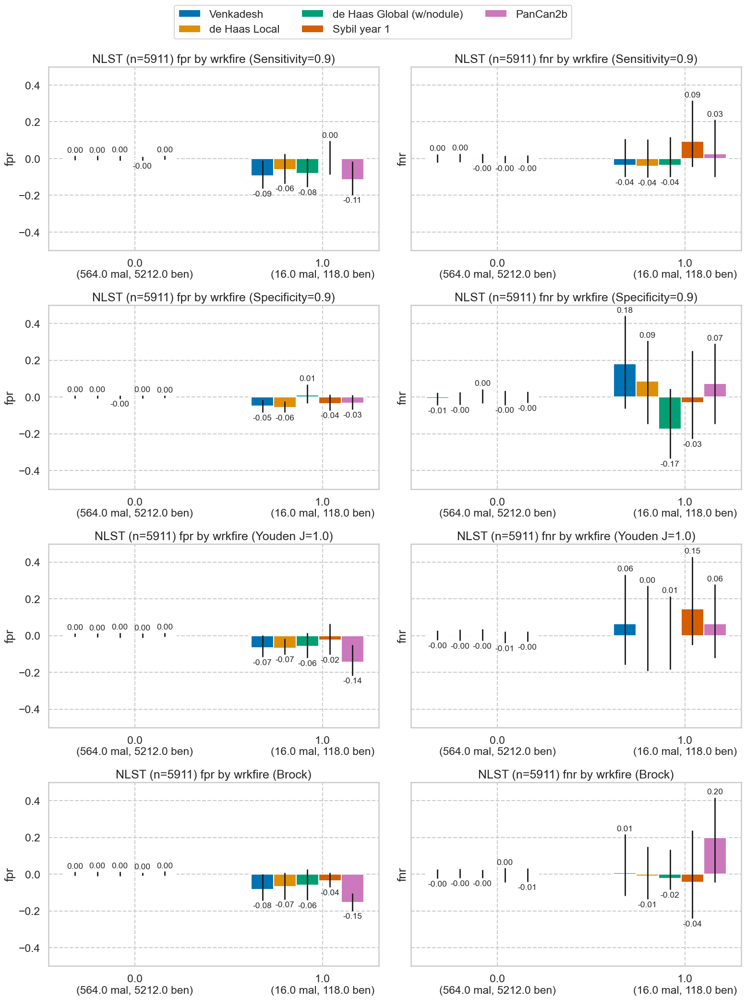

### wrksand

,num,pct,mal,ben,pct_mal
0.0,5800,98.122145,558,5242,9.62069
1.0,110,1.860937,22,88,20.00000


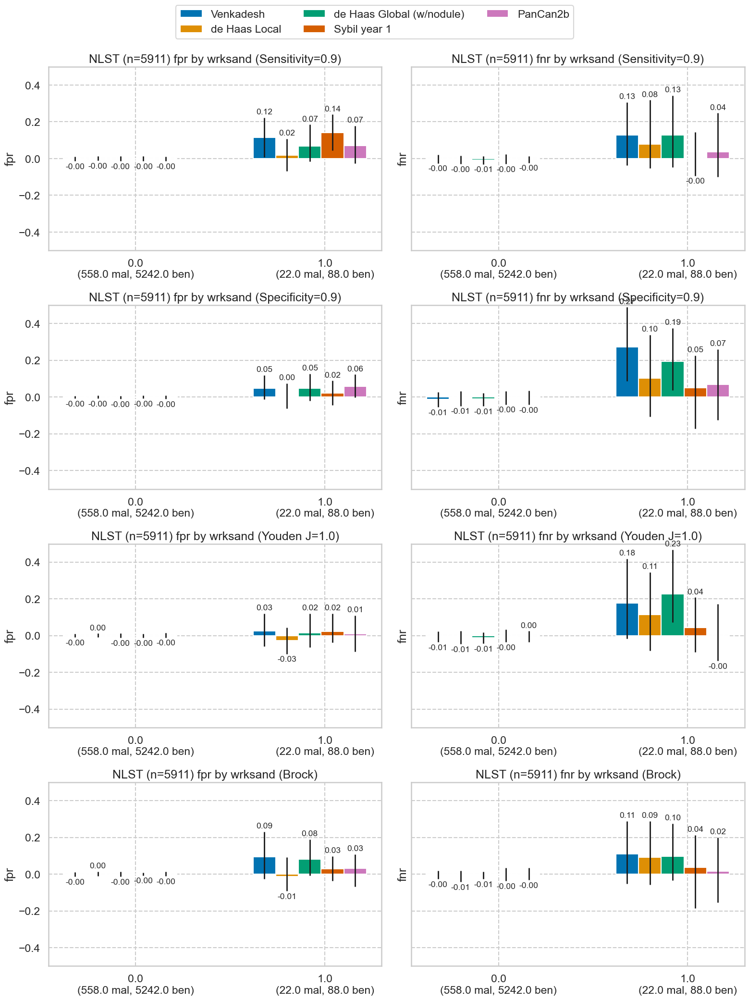

### wrkfarm

,num,pct,mal,ben,pct_mal
0.0,5197,87.920826,533,4664,10.255917
1.0,713,12.062257,47,666,6.591865


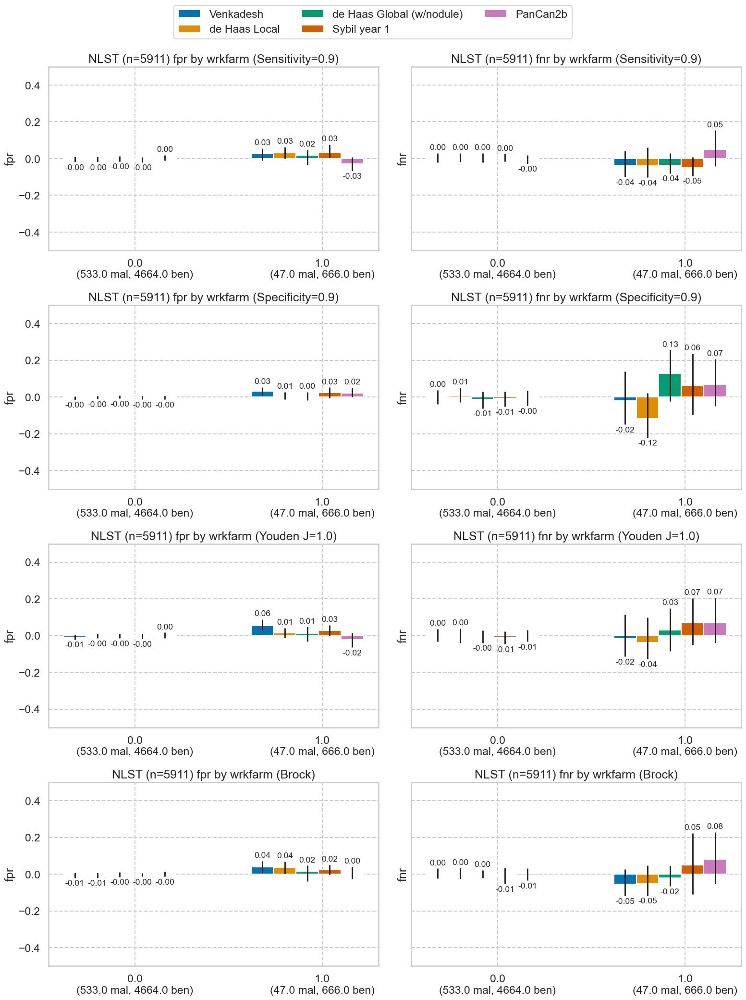

### wrkcoal

,num,pct,mal,ben,pct_mal
0.0,5888,99.610895,573,5315,9.731658
1.0,22,0.372187,7,15,31.818182


### wrkpain

,num,pct,mal,ben,pct_mal
0.0,5593,94.620200,544,5049,9.726444
1.0,317,5.362883,36,281,11.356467


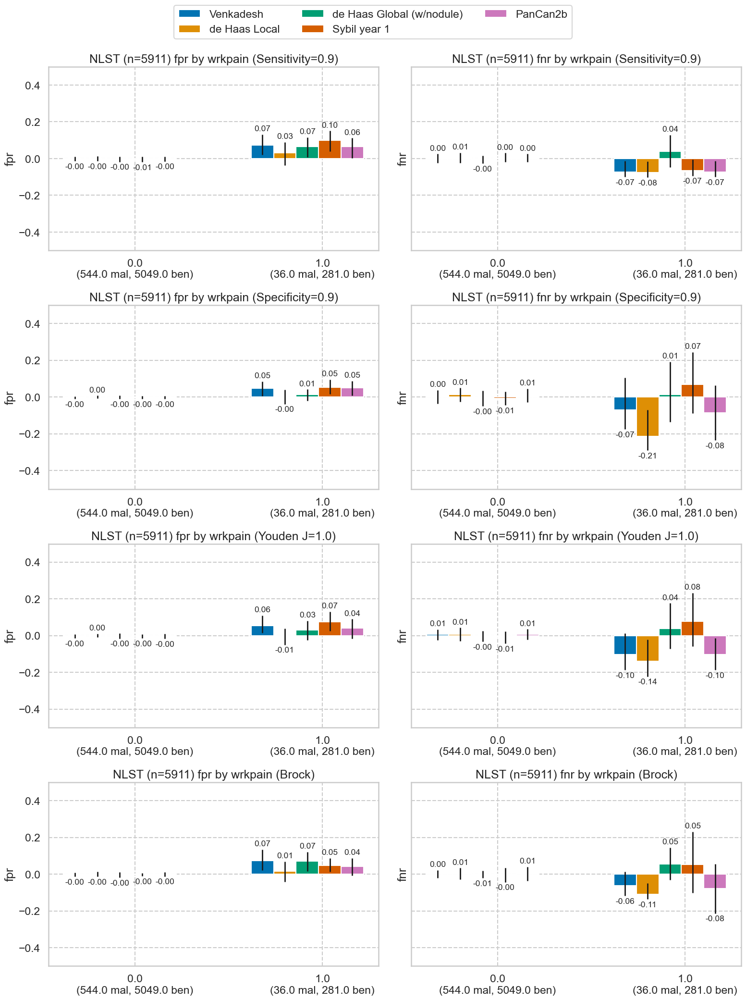

### wrkweld

,num,pct,mal,ben,pct_mal
0.0,5550,93.892742,540,5010,9.729730
1.0,360,6.090340,40,320,11.111111


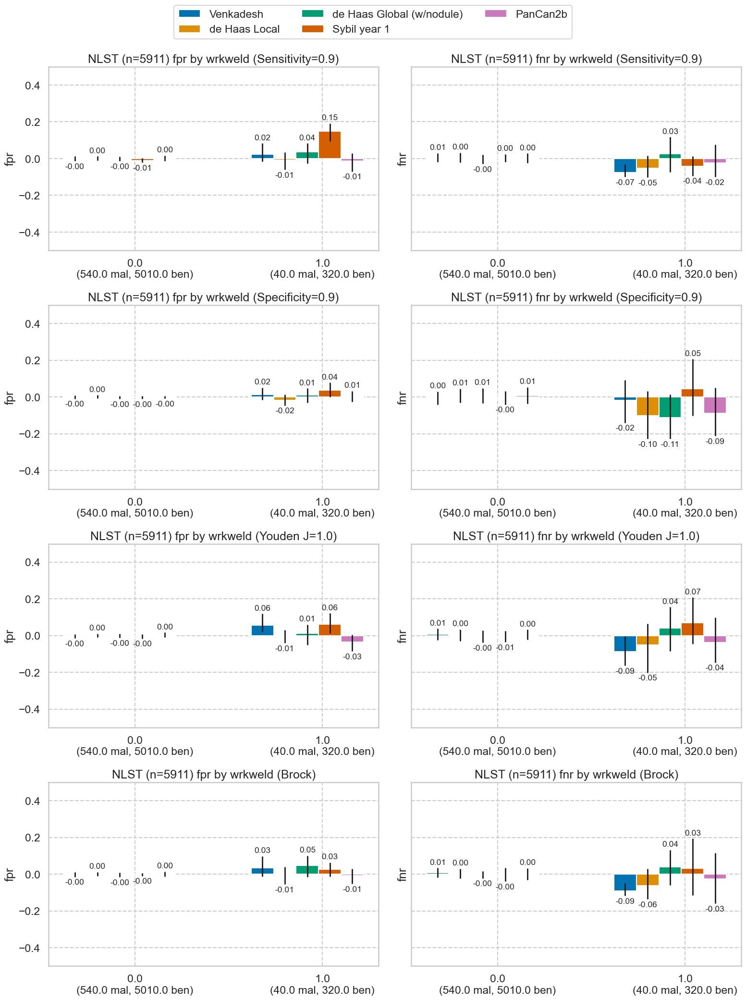

### wrkflou

,num,pct,mal,ben,pct_mal
0.0,5847,98.917273,573,5274,9.799897
1.0,63,1.065810,7,56,11.111111


### wrkbutc

,num,pct,mal,ben,pct_mal
0.0,5796,98.054475,570,5226,9.834369
1.0,114,1.928608,10,104,8.771930


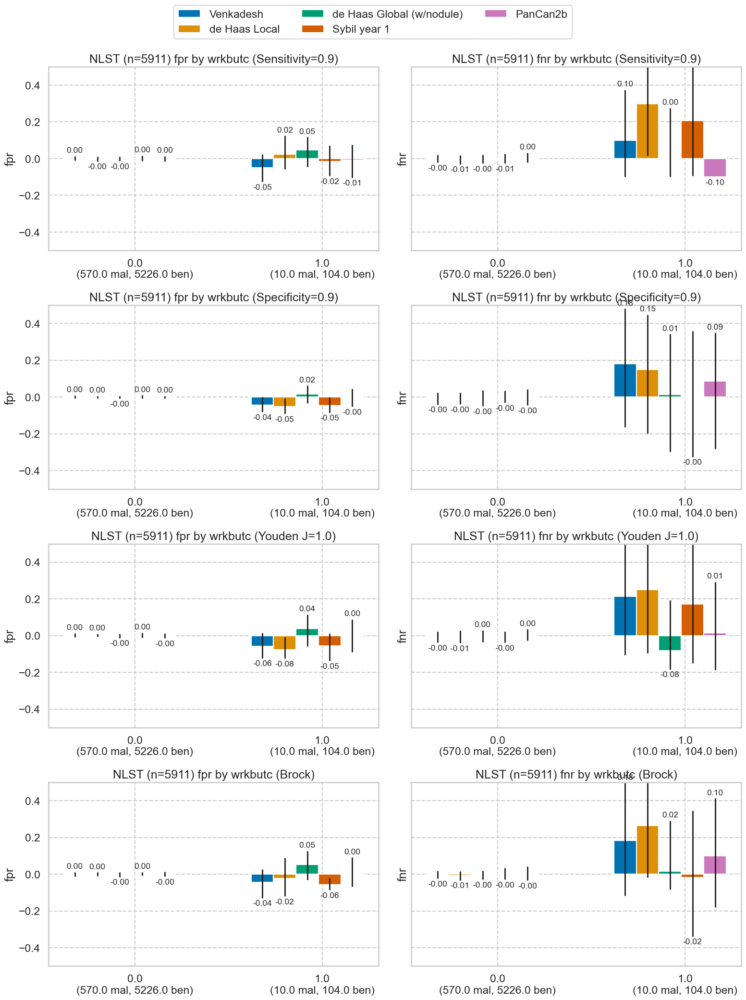

### wrkhard

,num,pct,mal,ben,pct_mal
0.0,5858,99.103367,579,5279,9.883919
1.0,52,0.879716,1,51,1.923077


### wrkcott

,num,pct,mal,ben,pct_mal
0.0,5858,99.103367,575,5283,9.815637
1.0,52,0.879716,5,47,9.615385


In [24]:
for cat in nlst_democols['cat']['work']:
    plot_by_category(nlst_preds, cat)

### Lung cancer type

### LC_stage

,num,pct,mal,ben,pct_mal
110.0,295,4.990695,295,0,100.0
120.0,61,1.031974,61,0,100.0
210.0,40,0.676704,40,0,100.0
220.0,16,0.270682,16,0,100.0
310.0,60,1.015057,60,0,100.0
320.0,20,0.338352,20,0,100.0
400.0,74,1.251903,74,0,100.0


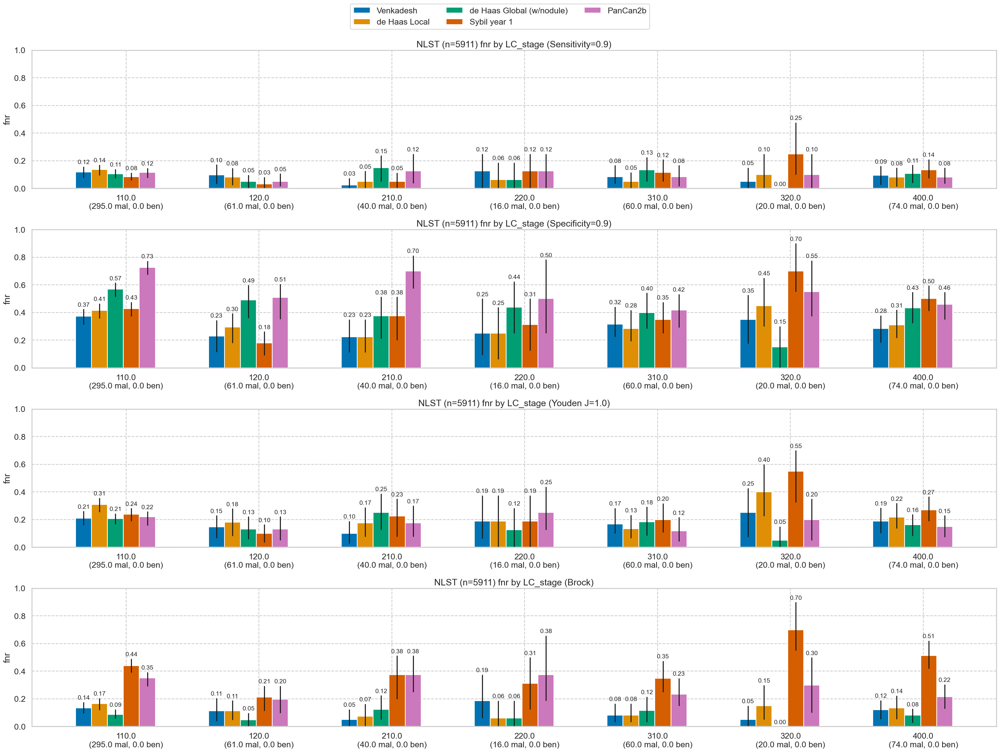

### Adenosquamous_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,5905,99.898494,575,5330,9.737511
True,6,0.101506,6,0,100.000000


### Small_cell_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,5889,99.627813,559,5330,9.492274
True,22,0.372187,22,0,100.000000


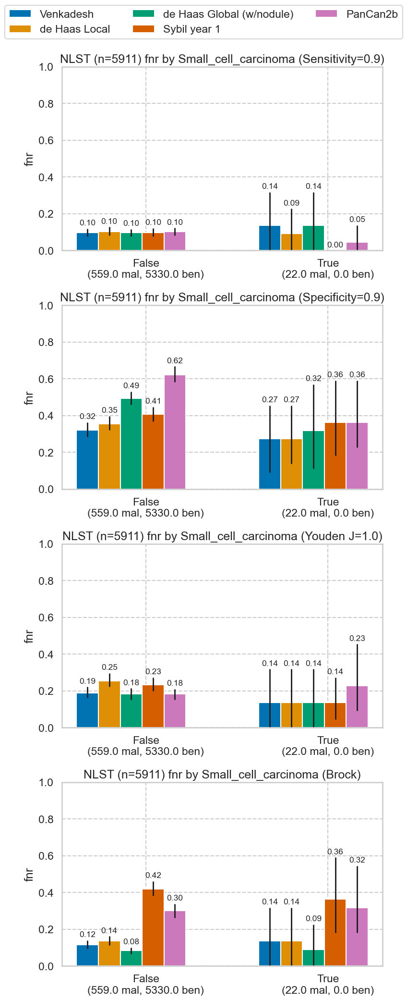

### Bronchiolo-alveolar_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,5813,98.342074,483,5330,8.308963
True,98,1.657926,98,0,100.000000


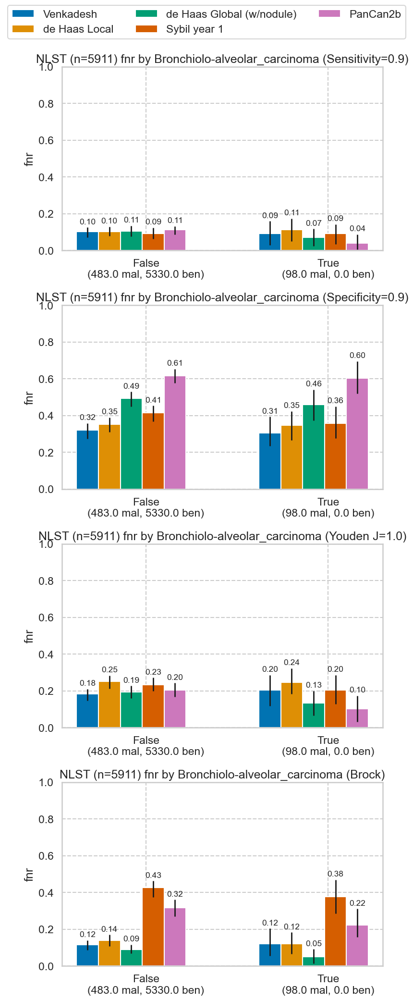

### Carcinoid_tumor

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,5905,99.898494,575,5330,9.737511
True,6,0.101506,6,0,100.000000


### Adenocarcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,5678,96.058197,348,5330,6.128919
True,233,3.941803,233,0,100.000000


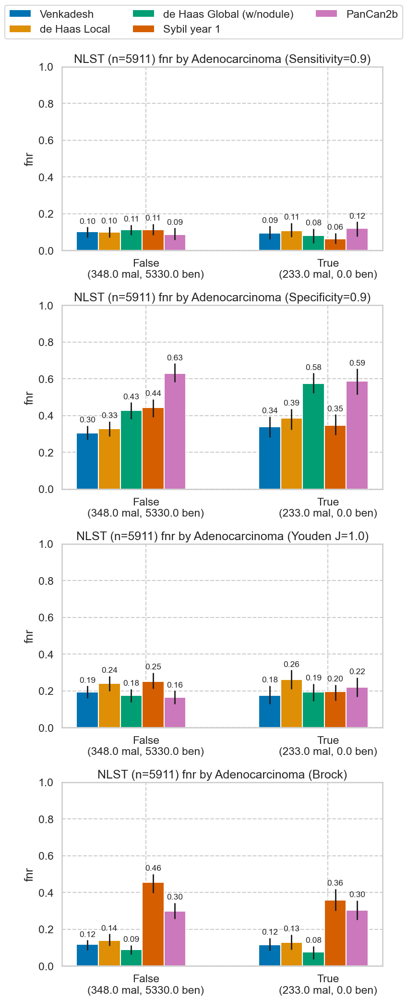

### Squamous_cell_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,5791,97.969887,461,5330,7.960629
True,120,2.030113,120,0,100.000000


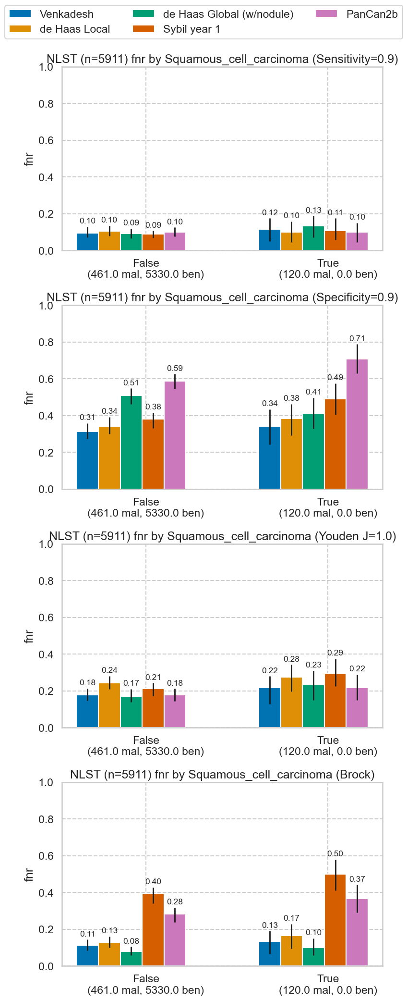

### Unclassified_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,5840,98.79885,510,5330,8.732877
True,71,1.20115,71,0,100.000000


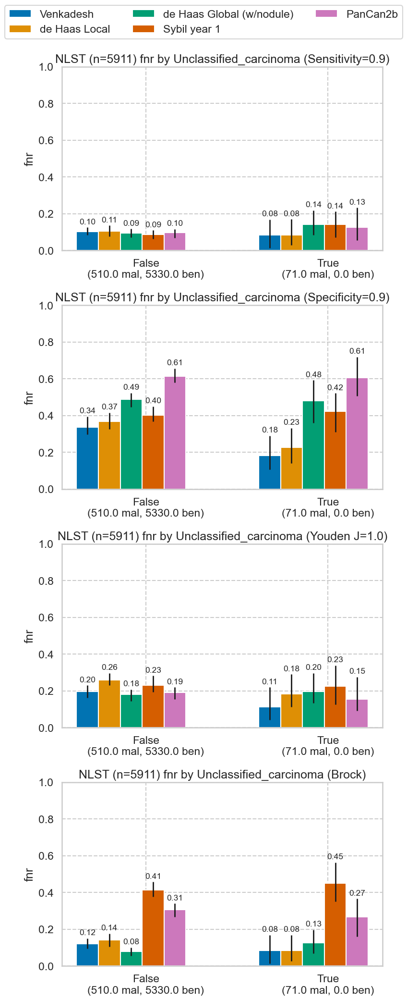

### Large_cell_carcinoma

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:189: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_lo = aggperfs.quantile((1 - ci_to_use) / 2, numeric_only=True)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:190: FutureWarning: Allowing bool dtype in DataFrameGroupBy.quantile is deprecated and will raise in a future version, matching the Series/DataFrame behavior. Cast to uint8 dtype before calling quantile instead.
  ci_hi = aggperfs.quantile(ci_to_use + ((1 - ci_to_use) / 2), numeric_only=True)


,num,pct,mal,ben,pct_mal
False,5892,99.678565,562,5330,9.538357
True,19,0.321435,19,0,100.000000


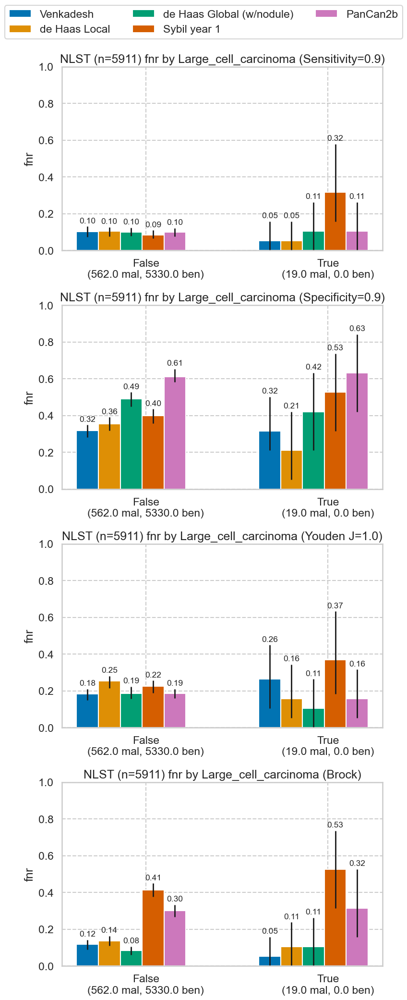

In [25]:
for cat in nlst_democols['cat']['lungcanc']:
    plot_by_category(nlst_preds, cat, metrics_to_plot=['fnr'], diff=False)

### Disease history

### diagasbe

,num,pct,mal,ben,pct_mal
0.0,5838,98.765014,572,5266,9.797876
1.0,65,1.099645,8,57,12.307692


### diagchas

,num,pct,mal,ben,pct_mal
0.0,5720,96.768736,566,5154,9.895105
1.0,185,3.129758,14,171,7.567568


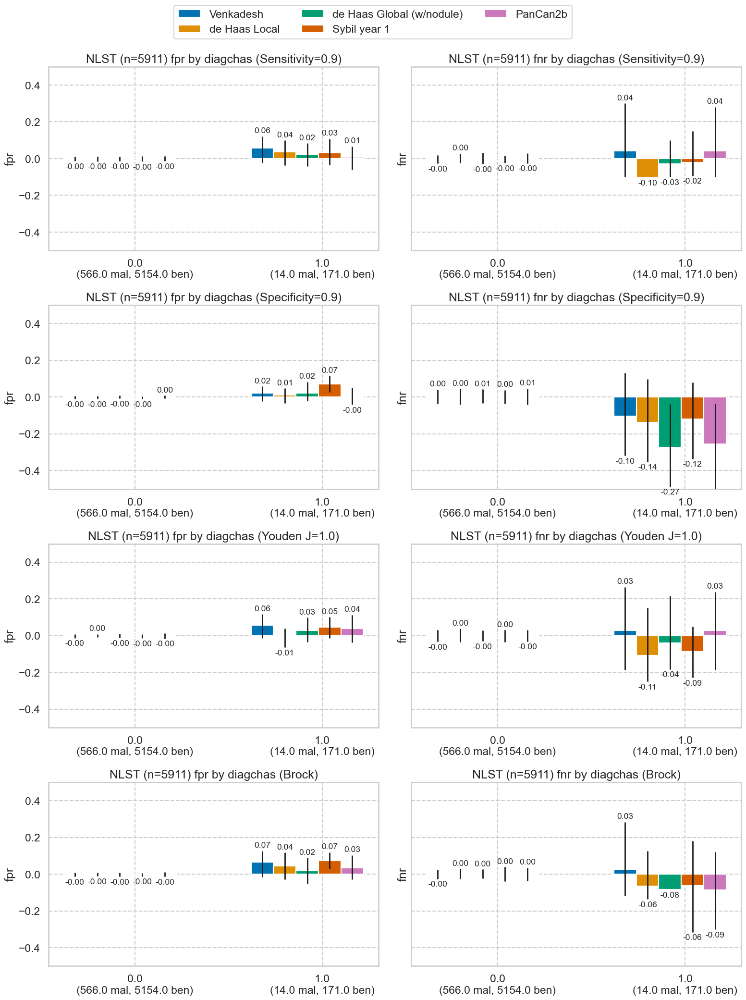

### diagpneu

,num,pct,mal,ben,pct_mal
0.0,4514,76.366097,438,4076,9.703146
1.0,1382,23.380139,136,1246,9.840810


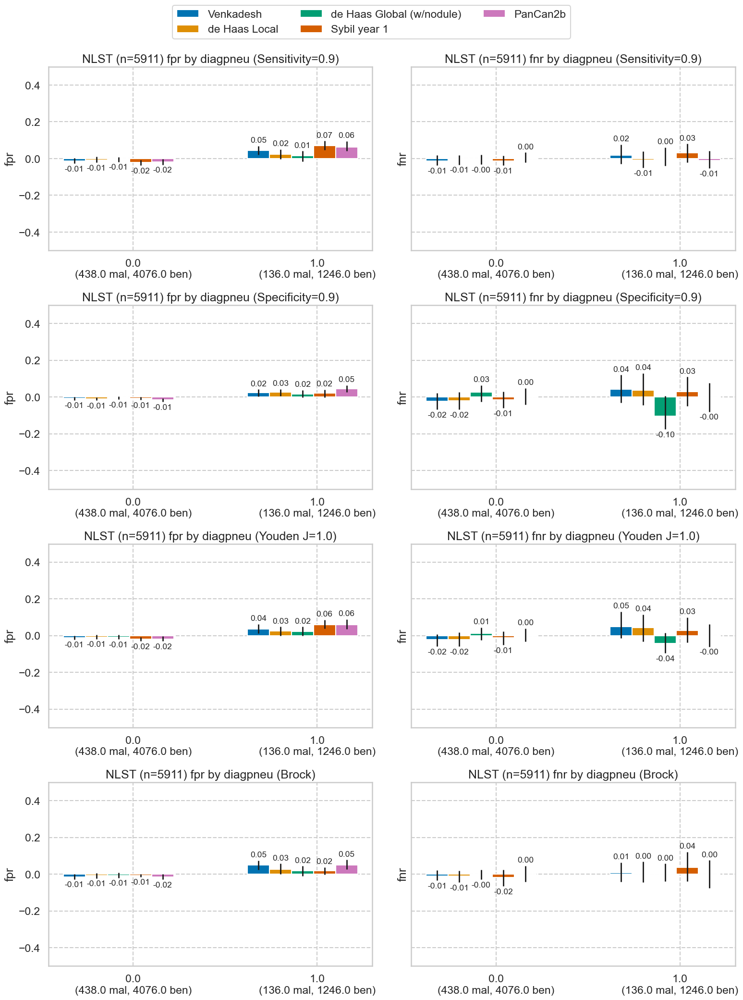

### diagstro

,num,pct,mal,ben,pct_mal
0.0,5710,96.599560,556,5154,9.737303
1.0,196,3.315852,24,172,12.244898


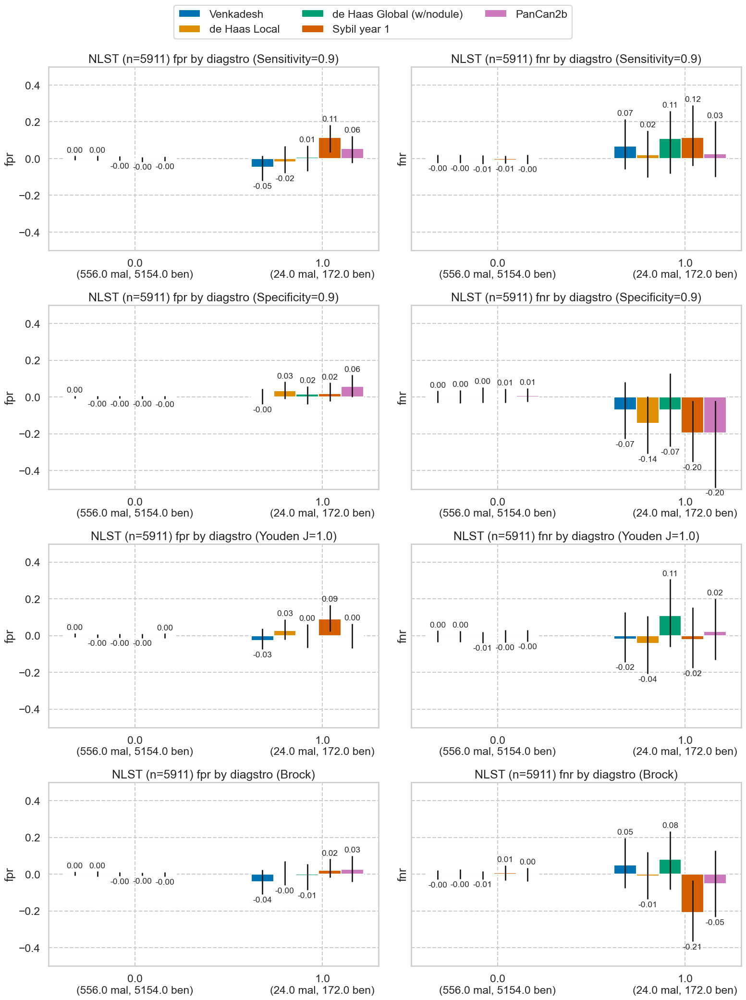

### diagemph

,num,pct,mal,ben,pct_mal
0.0,5265,89.071223,497,4768,9.439696
1.0,635,10.742683,82,553,12.913386


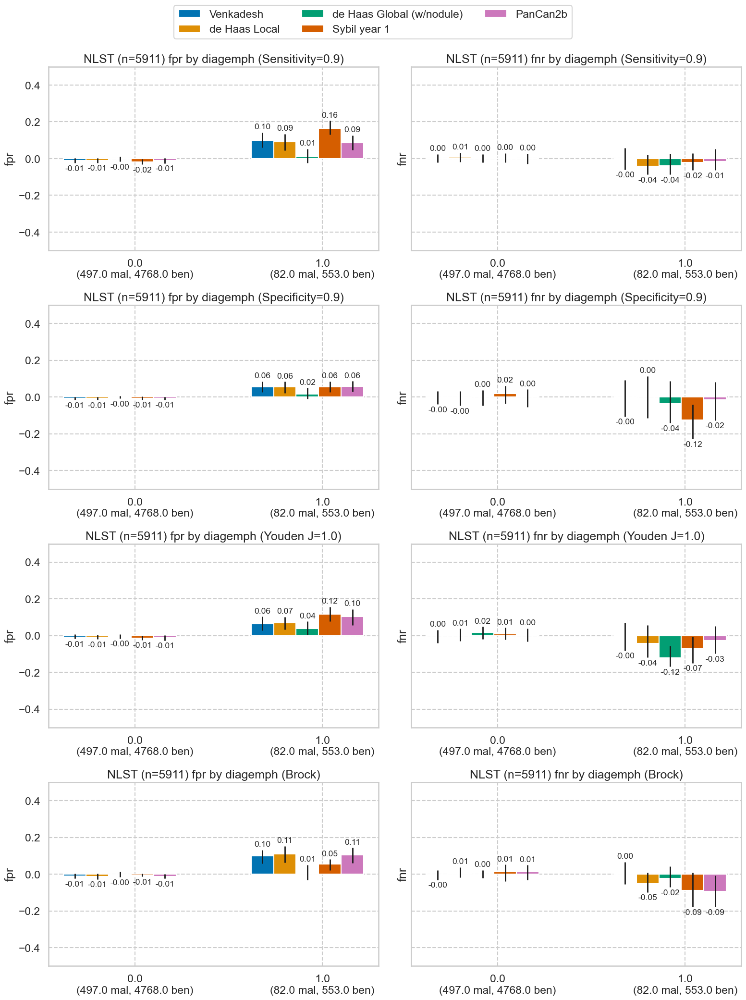

### diagbron

,num,pct,mal,ben,pct_mal
0.0,5706,96.531890,564,5142,9.884332
1.0,190,3.214346,13,177,6.842105


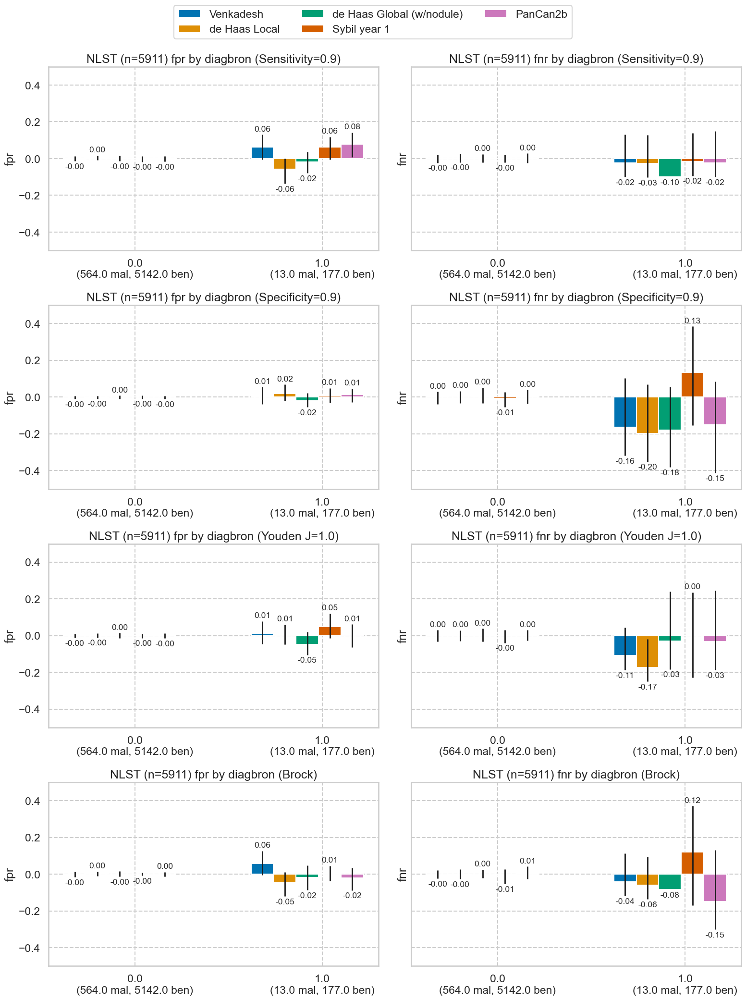

### diagsili

,num,pct,mal,ben,pct_mal
0.0,5887,99.593977,574,5313,9.750297
1.0,12,0.203011,4,8,33.333333


### diagsarc

,num,pct,mal,ben,pct_mal
0.0,5889,99.627813,576,5313,9.780948
1.0,10,0.169176,2,8,20.000000


### diaghear

,num,pct,mal,ben,pct_mal
0.0,5087,86.059888,492,4595,9.671712
1.0,802,13.567924,87,715,10.847880


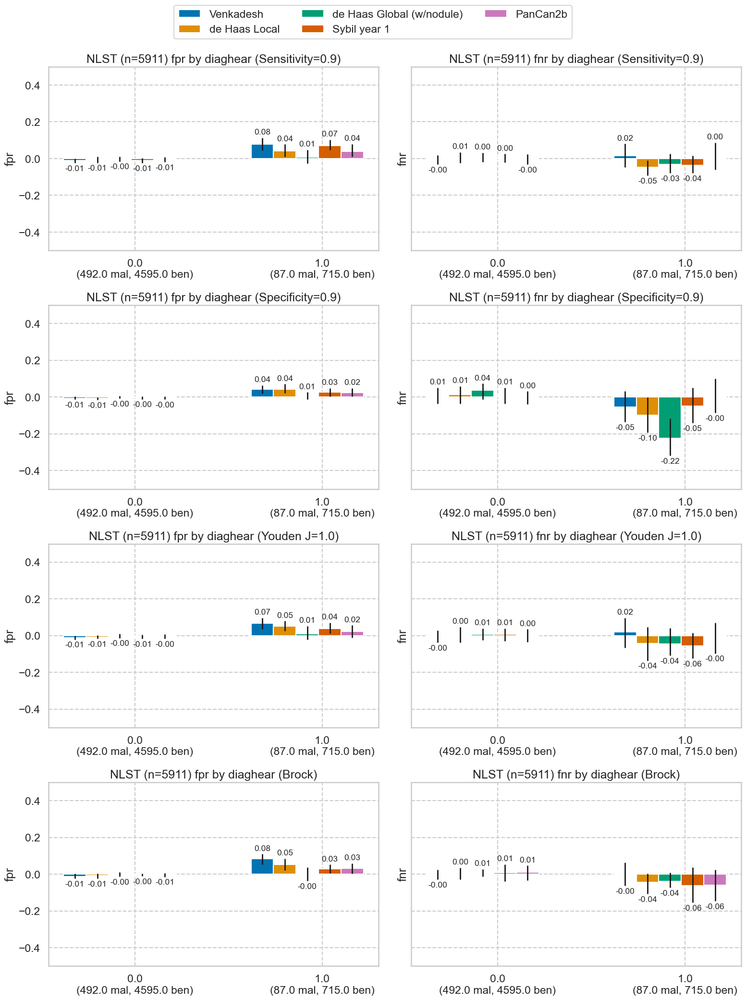

### diagdiab

,num,pct,mal,ben,pct_mal
0.0,5362,90.712231,523,4839,9.753823
1.0,545,9.220098,57,488,10.458716


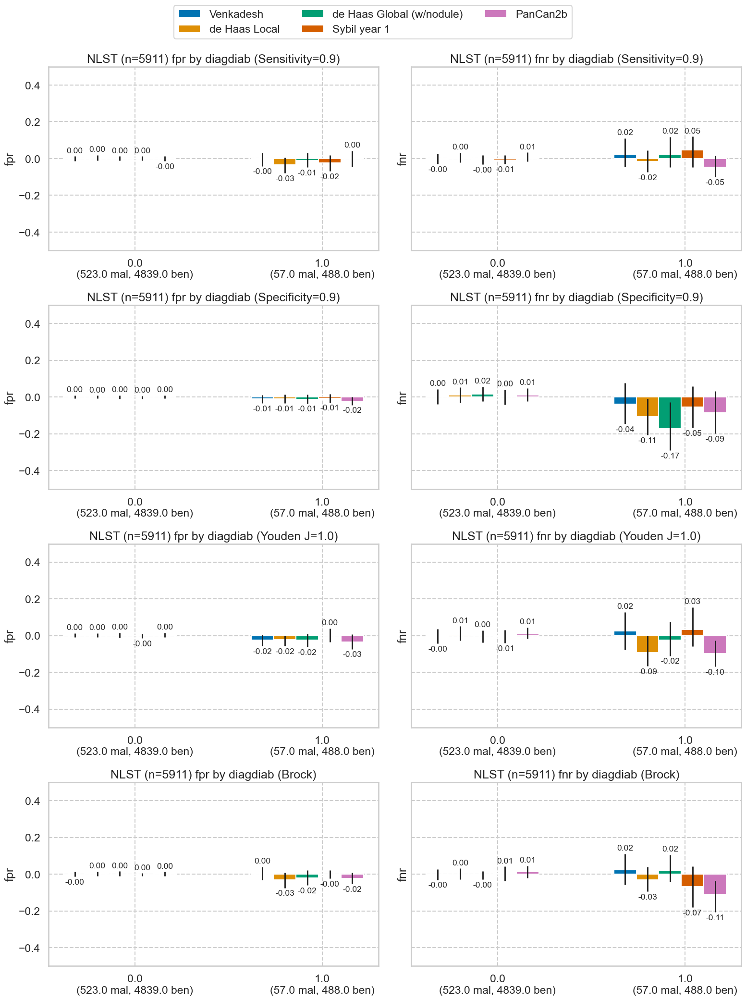

### diagadas

,num,pct,mal,ben,pct_mal
0.0,5534,93.622061,541,4993,9.775931
1.0,375,6.344104,39,336,10.400000


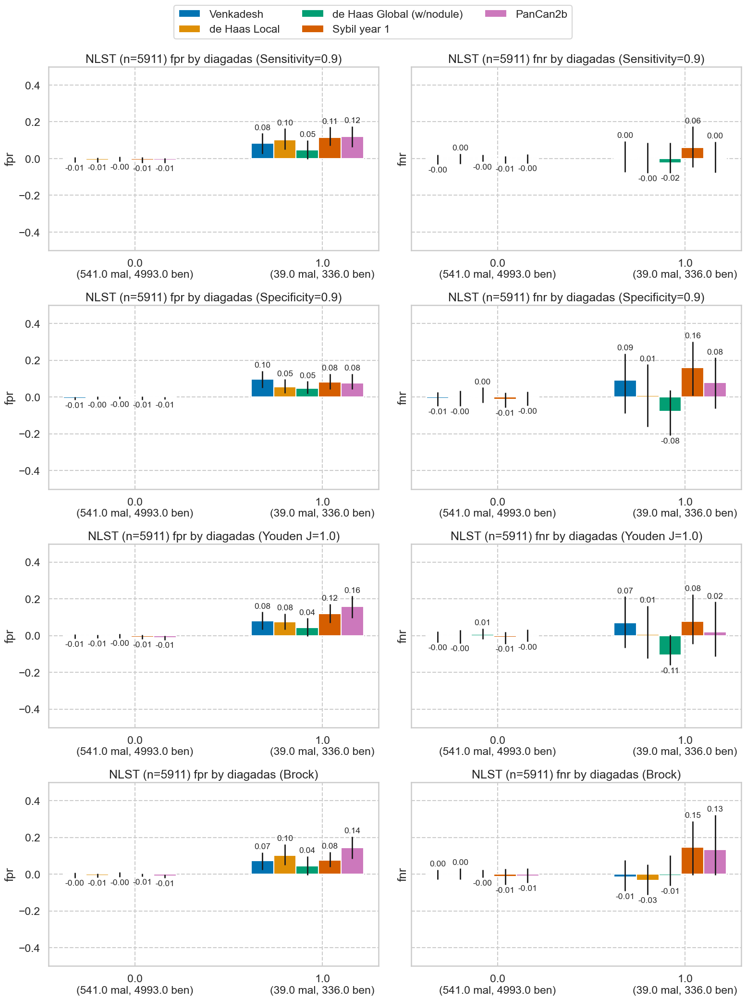

### diagcopd

,num,pct,mal,ben,pct_mal
0.0,5492,92.911521,516,4976,9.395484
1.0,401,6.783962,63,338,15.710723


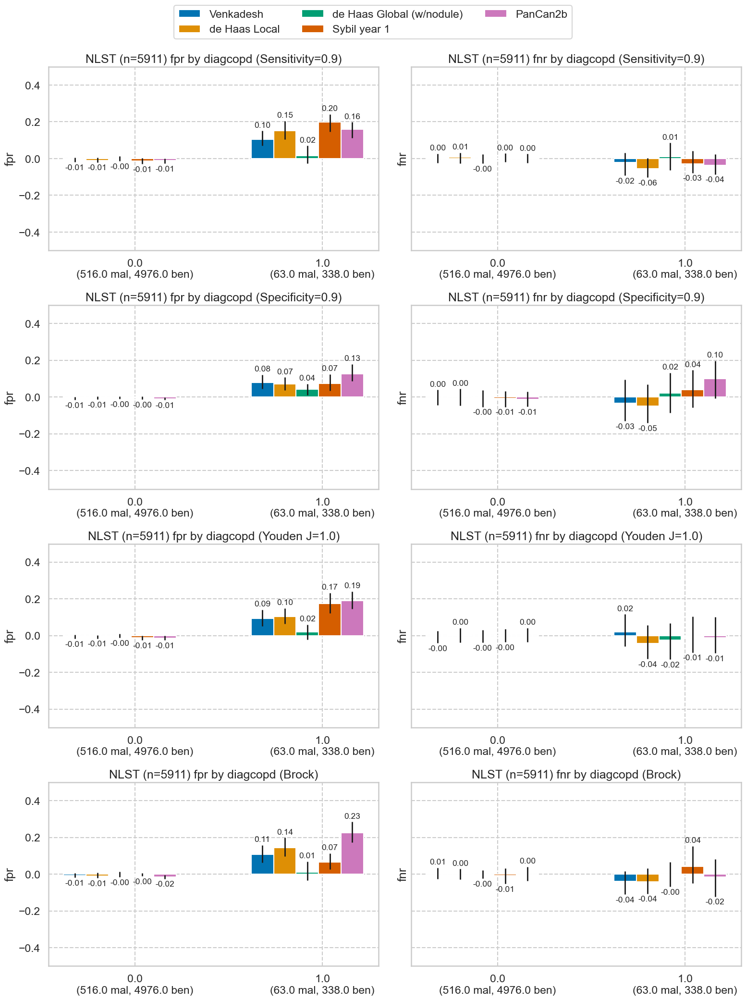

### diagfibr

,num,pct,mal,ben,pct_mal
0.0,5887,99.593977,578,5309,9.818244
1.0,14,0.236847,2,12,14.285714


### diagtube

,num,pct,mal,ben,pct_mal
0.0,5839,98.781932,569,5270,9.744819
1.0,66,1.116562,11,55,16.666667


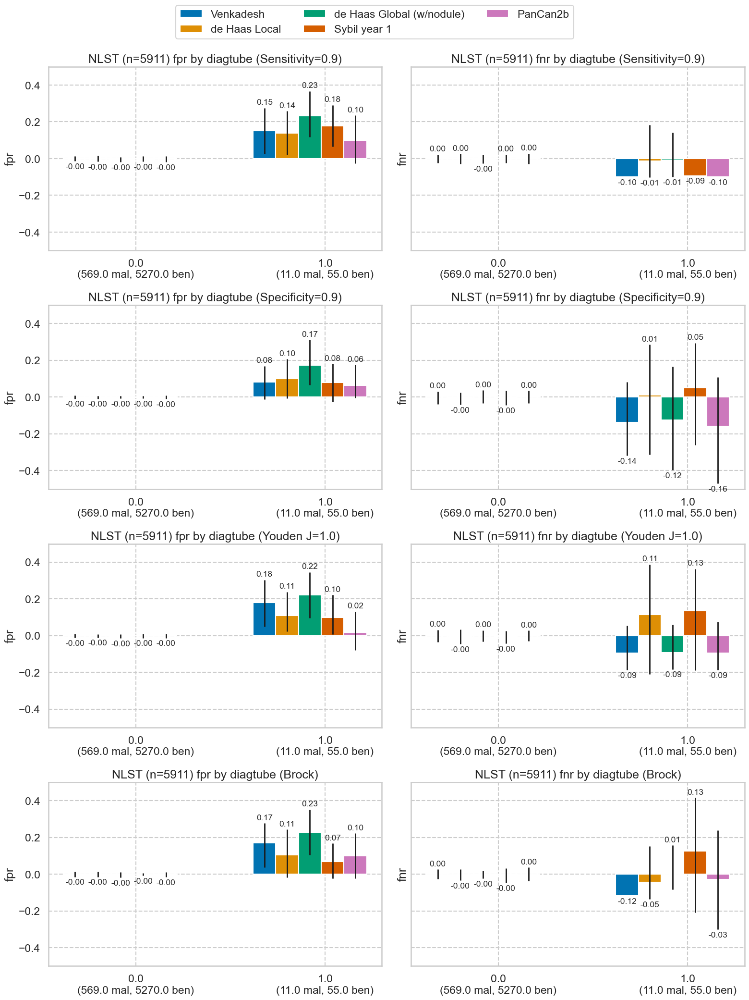

### diaghype

,num,pct,mal,ben,pct_mal
0.0,3909,66.130942,352,3557,9.004861
1.0,1993,33.716799,223,1770,11.189162


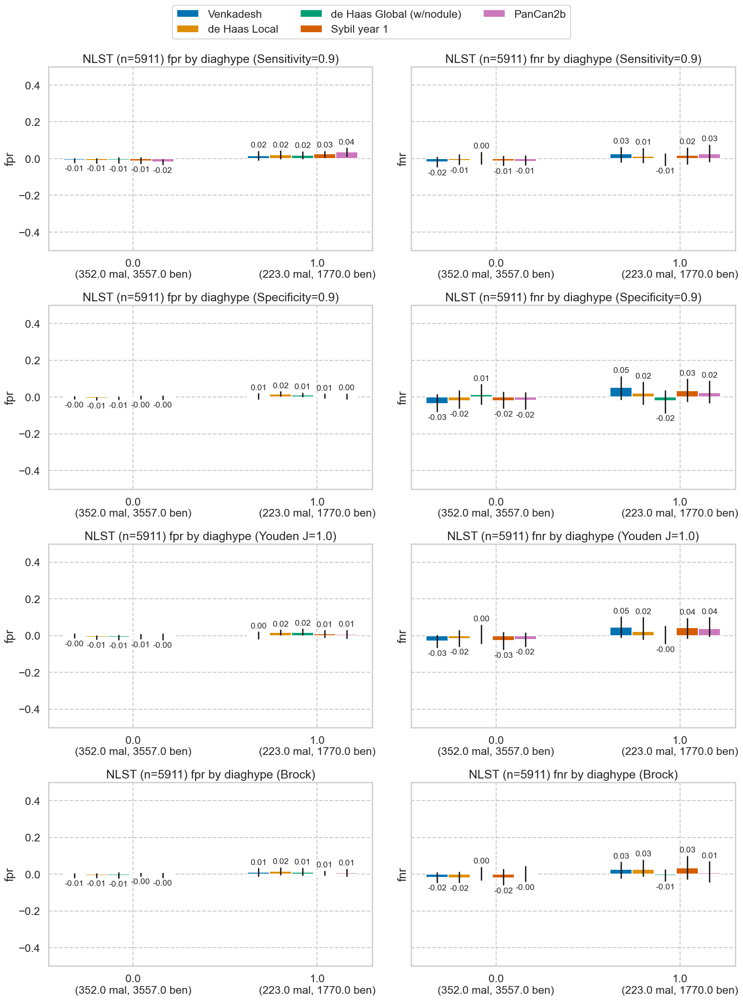

### diagchro

,num,pct,mal,ben,pct_mal
0.0,5276,89.257317,521,4755,9.874905
1.0,619,10.472001,56,563,9.046850


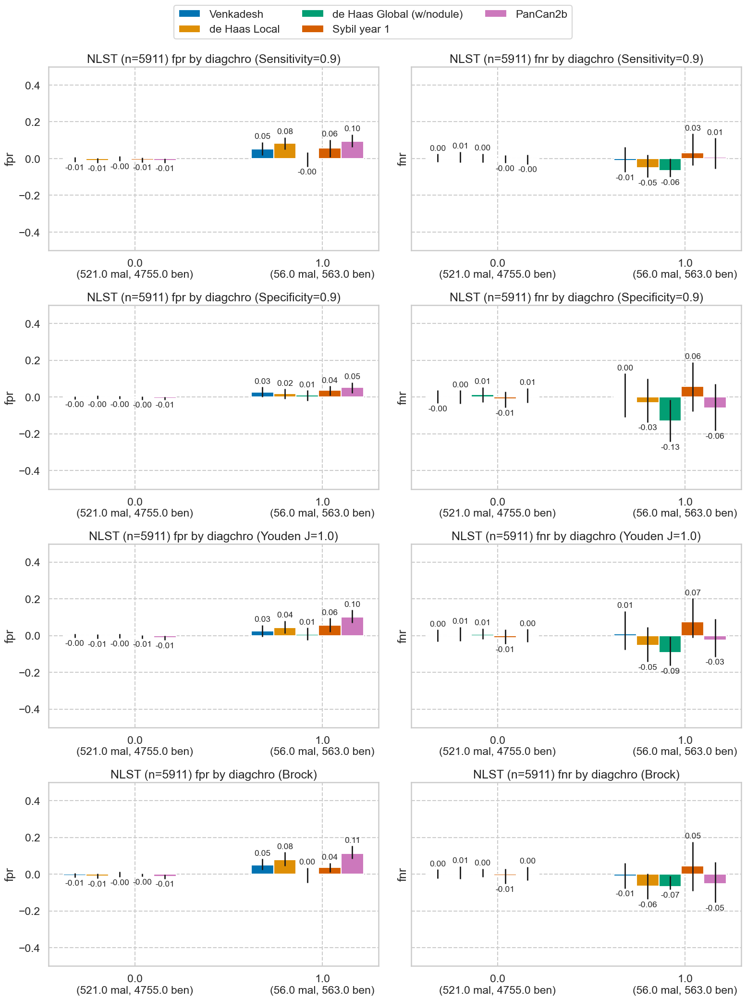

In [26]:
for cat in nlst_democols['cat']['disease']:
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

C:\Users\shaur\AppData\Local\Temp\ipykernel_19036\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                          \
                              count      mean       std  min  25%  50%  75%   
bin_BMI                                                                       
(13.283000000000001, 26.87]  2956.0  0.112314  0.315806  0.0  0.0  0.0  0.0   
(26.87, 57.631]              2936.0  0.082425  0.275058  0.0  0.0  0.0  0.0   

                                     BMI                                  \
                             max   count       mean       std        min   
bin_BMI                                                                    
(13.283000000000001, 26.87]  1.0  2956.0  23.753599  2.257101  13.284203   
(26.87, 57.631]              1.0  2936.0  31.382861  3.818099  26.873766   

                                                                         
                                   25%        50%        75%        max  
bin_BMI                                                                  
(13.283000000000001, 26.87]  22.312778  24.207989  25.603538  26.870222  
(26.87, 57.631]              28.478009  30.406574  33.190637  57.630653

### bin_BMI

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and

,num,pct,mal,ben,pct_mal
"(13.283000000000001, 26.87]",2956,50.008459,332,2624,11.231394
"(26.87, 57.631]",2936,49.670107,242,2694,8.242507


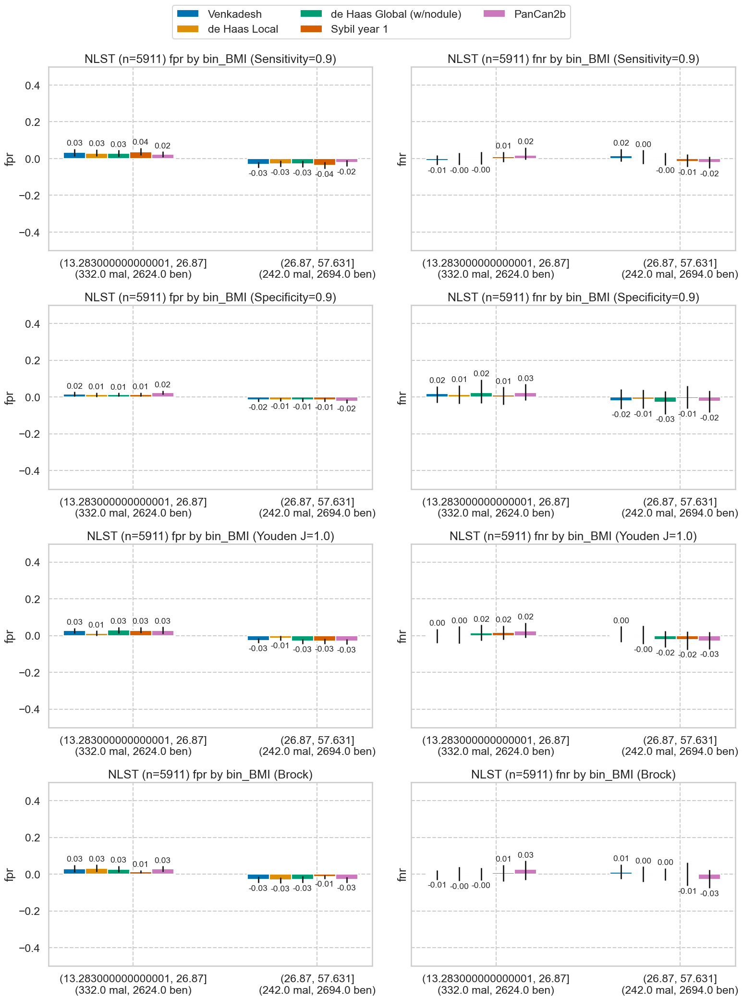

C:\Users\shaur\AppData\Local\Temp\ipykernel_19036\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                  Age  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_Age                                                                       
(53.999, 62.0]  2988.0  0.088353  0.283856  0.0  0.0  0.0  0.0  1.0  2988.0   
(62.0, 76.0]    2923.0  0.108450  0.311001  0.0  0.0  0.0  0.0  1.0  2923.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_Age                                                            
(53.999, 62.0]  58.811245  2.123374  54.0  57.0  59.0  61.0  62.0  
(62.0, 76.0]    67.653780  3.453298  63.0  65.0  67.0  70.0  76.0

### bin_Age

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and

,num,pct,mal,ben,pct_mal
"(53.999, 62.0]",2988,50.549822,264,2724,8.835341
"(62.0, 76.0]",2923,49.450178,317,2606,10.845022


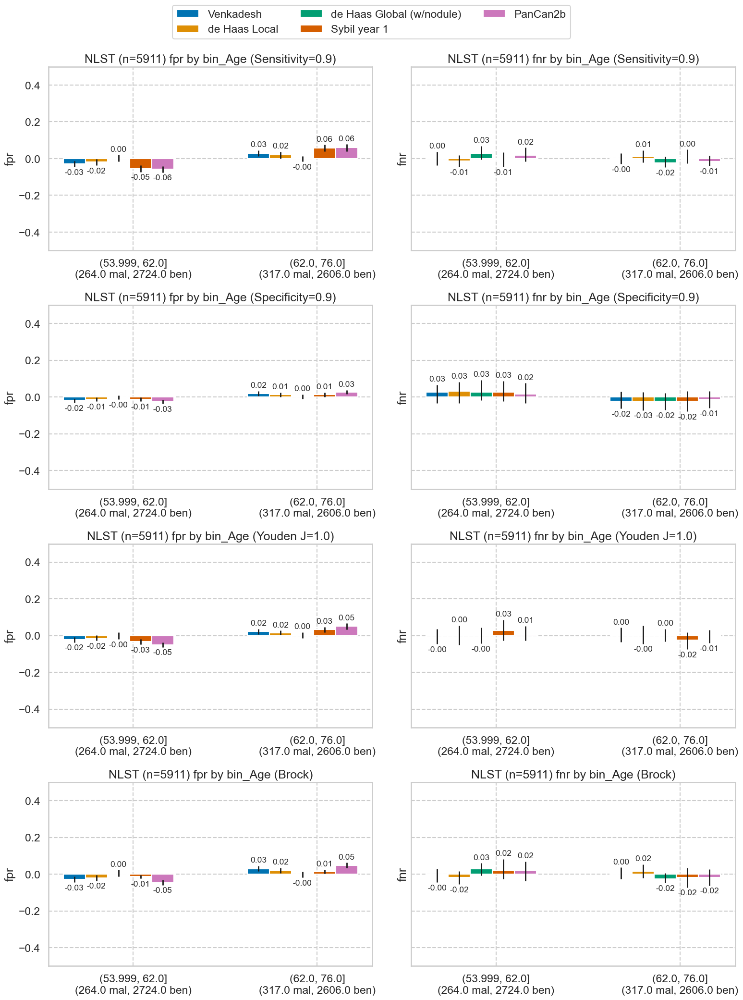

C:\Users\shaur\AppData\Local\Temp\ipykernel_19036\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               height  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                    
(52.999, 68.0]  3134.0  0.099553  0.299451  0.0  0.0  0.0  0.0  1.0  3134.0   
(68.0, 83.0]    2767.0  0.096494  0.295321  0.0  0.0  0.0  0.0  1.0  2767.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_height                                                         
(52.999, 68.0]  64.869177  2.355045  53.0  63.0  65.0  67.0  68.0  
(68.0, 83.0]    71.503072  1.994545  69.0  70.0  71.0  73.0  83.0

### bin_height

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and

,num,pct,mal,ben,pct_mal
"(52.999, 68.0]",3134,53.019794,312,2822,9.955329
"(68.0, 83.0]",2767,46.811030,267,2500,9.649440


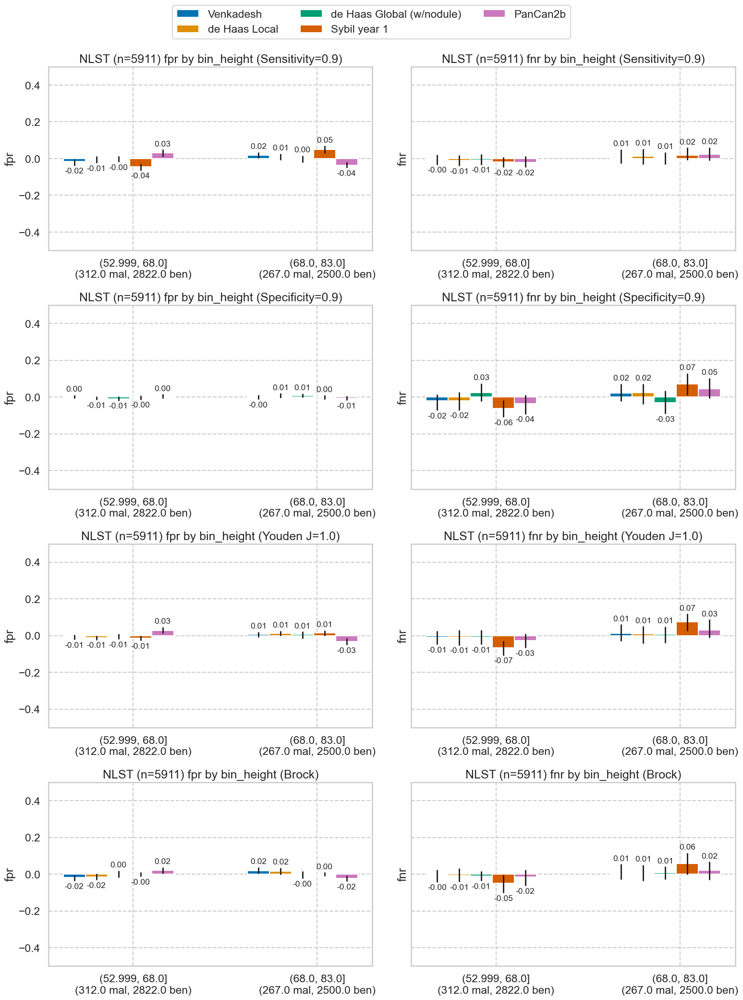

C:\Users\shaur\AppData\Local\Temp\ipykernel_19036\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               weight  \
                  count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                     
(74.999, 180.0]  3082.0  0.106424  0.308430  0.0  0.0  0.0  0.0  1.0  3082.0   
(180.0, 368.0]   2816.0  0.087713  0.282927  0.0  0.0  0.0  0.0  1.0  2816.0   

                                                                           
                       mean        std    min    25%    50%    75%    max  
bin_weight                                                                 
(74.999, 180.0]  152.228423  20.400591   75.0  139.0  155.0  170.0  180.0  
(180.0, 368.0]   214.422585  27.365632  181.0  193.0  208.0  230.0  368.0

### bin_weight

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and

,num,pct,mal,ben,pct_mal
"(74.999, 180.0]",3082,52.140078,328,2754,10.642440
"(180.0, 368.0]",2816,47.639993,247,2569,8.771307


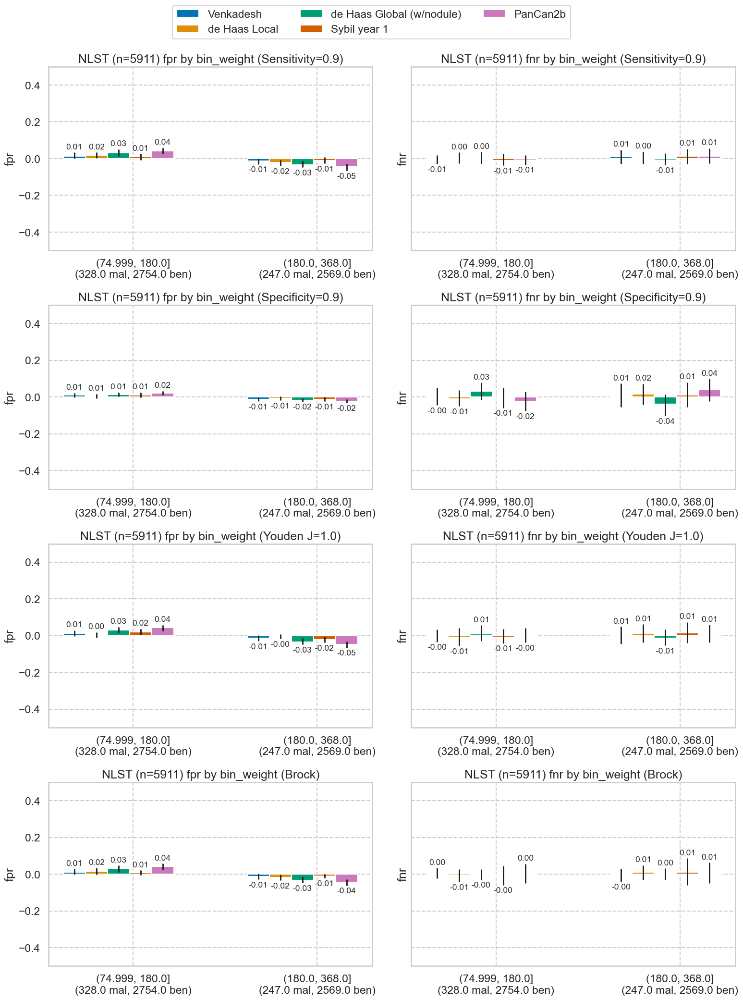

In [28]:
for c in nlst_democols['num']['demo']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

C:\Users\shaur\AppData\Local\Temp\ipykernel_19036\2670985764.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bmi_classes')[['label', 'BMI']].describe())


label                                                  BMI  \
              count      mean       std  min  25%  50%  75%  max   count   
bmi_classes                                                                
[0, 25)      1880.0  0.107447  0.309763  0.0  0.0  0.0  0.0  1.0  1880.0   
[25, 100)    4012.0  0.092722  0.290078  0.0  0.0  0.0  0.0  1.0  4012.0   

                                                                              \
                  mean       std        min        25%        50%        75%   
bmi_classes                                                                    
[0, 25)      22.519770  1.907369  13.284203  21.303030  22.955102  24.102857   
[25, 100)    29.914893  4.078893  25.014922  26.628788  29.013695  32.074985   

                        
                   max  
bmi_classes             
[0, 25)      24.995556  
[25, 100)    57.630653

### bmi_classes

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and

,num,pct,mal,ben,pct_mal
"[0, 25)",1880,31.805109,202,1678,10.744681
"[25, 100)",4012,67.873456,372,3640,9.272183


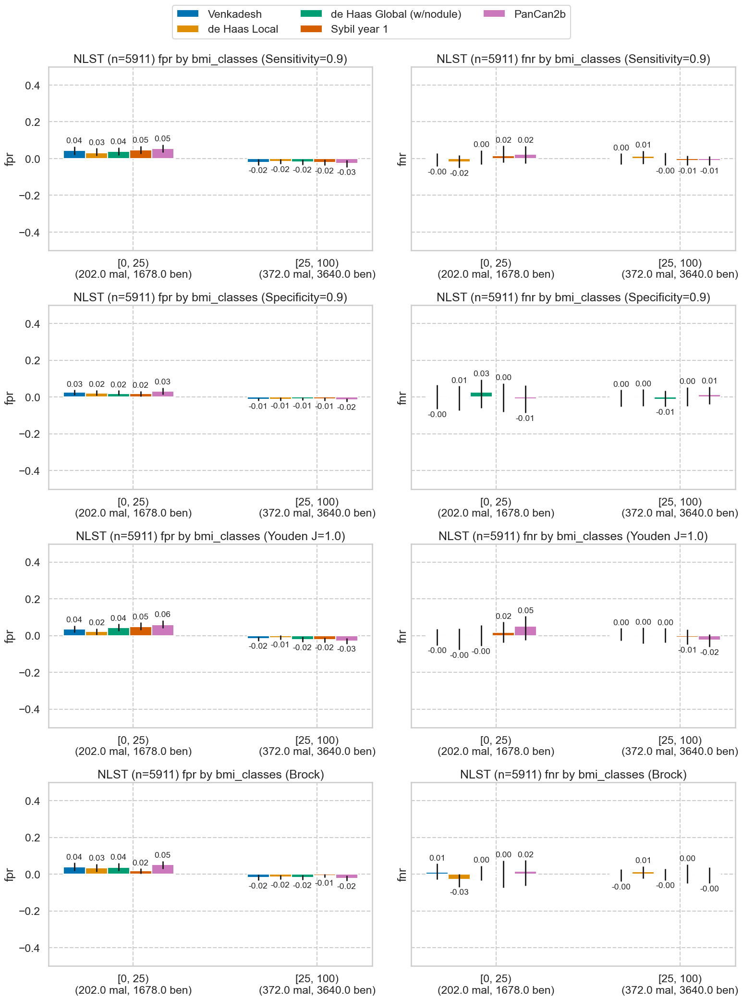

In [29]:
nlst_preds['bmi_classes'] = pd.cut(nlst_preds['BMI'], bins=[0, 
                                                            # 18.5, 
                                                            25, 
                                                            # 30, 
                                                            100], right=False)
display(nlst_preds.groupby('bmi_classes')[['label', 'BMI']].describe())
plot_by_category(nlst_preds, f'bmi_classes')

### Smoking columns

#### smokeage

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,16.524015,3.508332,5.0,15.0,16.0,18.0,40.0
1,581.0,16.204819,3.520048,6.0,14.0,16.0,18.0,30.0


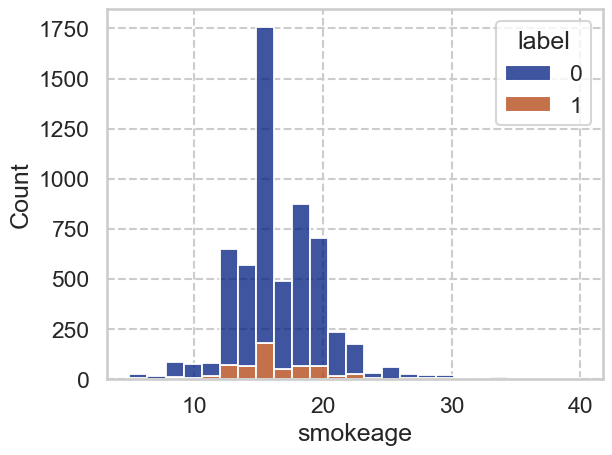

#### smokeday

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,28.436961,11.575912,12.0,20.0,25.0,35.0,135.0
1,581.0,30.485370,12.745731,15.0,20.0,30.0,40.0,80.0


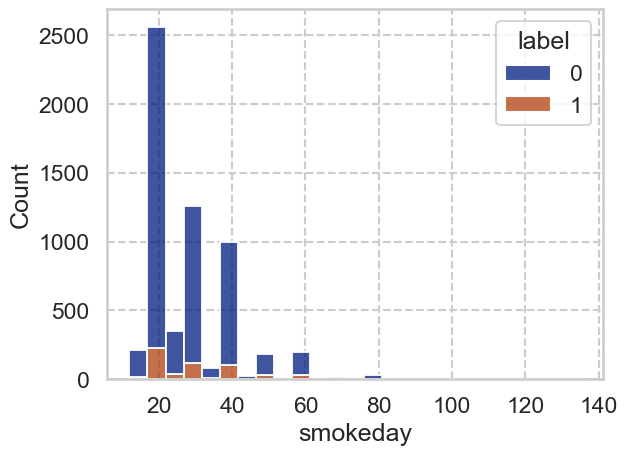

#### smokeyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,40.903940,7.364423,16.0,36.0,41.0,46.0,67.0
1,581.0,43.595525,7.225905,25.0,39.0,44.0,49.0,65.0


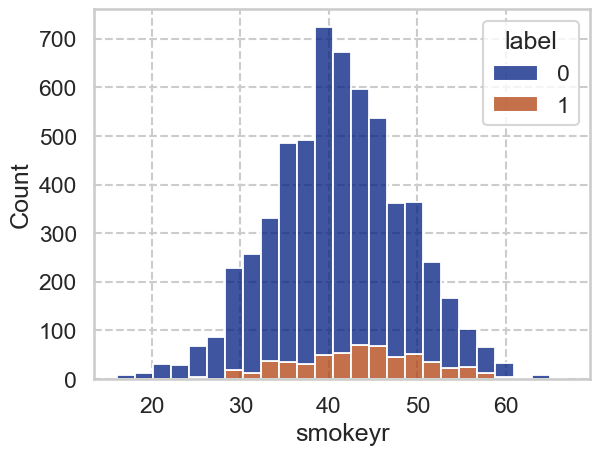

#### pkyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,57.459653,24.397554,30.0,40.0,50.0,68.0,260.0
1,581.0,66.164716,30.131594,30.0,45.0,56.0,84.0,232.0


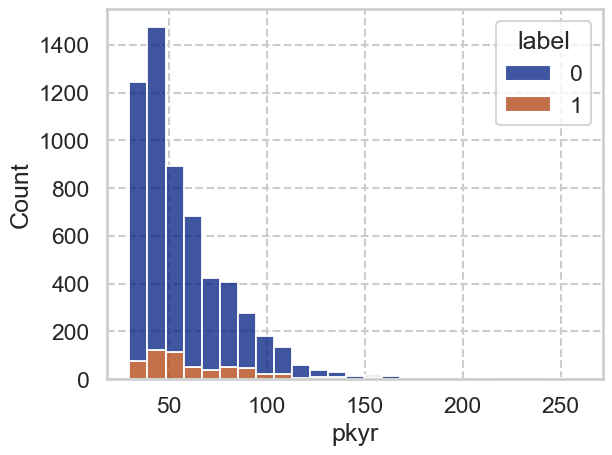

In [30]:
for c in nlst_democols['num']['smoke']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                              smokeage  \
               count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                 
0             3256.0  0.106572  0.308616  0.0  0.0  0.0  0.0  1.0   3256.0   
1             2655.0  0.088136  0.283545  0.0  0.0  0.0  0.0  1.0   2655.0   

                                                                 
                   mean       std   min   25%   50%   75%   max  
bin_smokeage                                                     
0             14.136978  2.000377   5.0  13.0  15.0  16.0  16.0  
1             19.381544  2.716198  17.0  18.0  18.0  20.0  40.0

### bin_smokeage

,num,pct,mal,ben,pct_mal
0,3256,55.083742,347,2909,10.657248
1,2655,44.916258,234,2421,8.813559


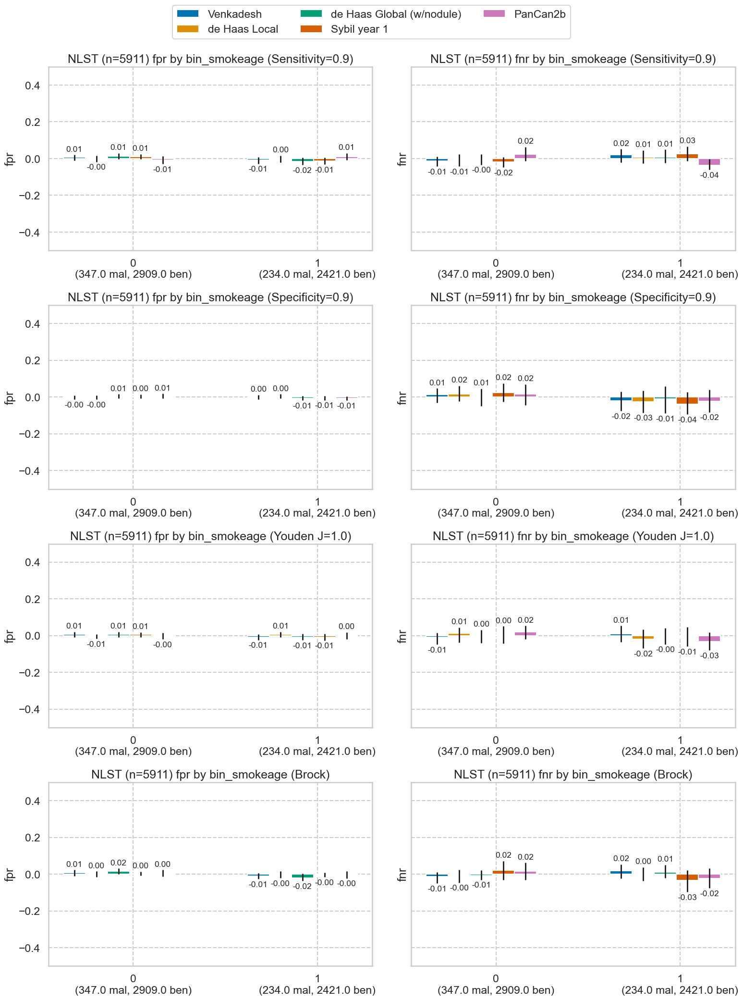

label                                              smokeday  \
               count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                 
0             3119.0  0.089772  0.285901  0.0  0.0  0.0  0.0  1.0   3119.0   
1             2792.0  0.107808  0.310193  0.0  0.0  0.0  0.0  1.0   2792.0   

                                                                   
                   mean        std   min   25%   50%   75%    max  
bin_smokeday                                                       
0             20.117025   2.153974  12.0  20.0  20.0  20.0   25.0  
1             38.157593  10.650142  26.0  30.0  40.0  40.0  135.0

### bin_smokeday

,num,pct,mal,ben,pct_mal
0,3119,52.766029,280,2839,8.977236
1,2792,47.233971,301,2491,10.780802


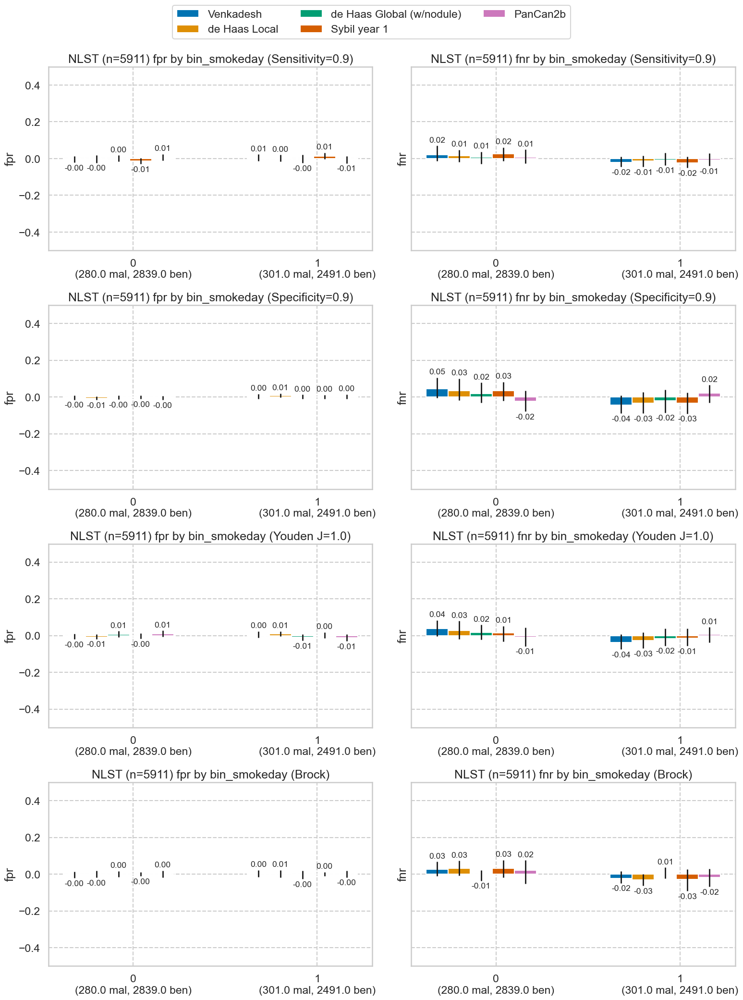

label                                              smokeyr  \
              count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                
0            3073.0  0.070290  0.255676  0.0  0.0  0.0  0.0  1.0  3073.0   
1            2838.0  0.128612  0.334829  0.0  0.0  0.0  0.0  1.0  2838.0   

                                                                
                  mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                     
0            35.559714  4.645131  16.0  33.0  36.0  39.0  41.0  
1            47.241720  4.421492  42.0  44.0  46.0  50.0  67.0

### bin_smokeyr

,num,pct,mal,ben,pct_mal
0,3073,51.987819,216,2857,7.028962
1,2838,48.012181,365,2473,12.861170


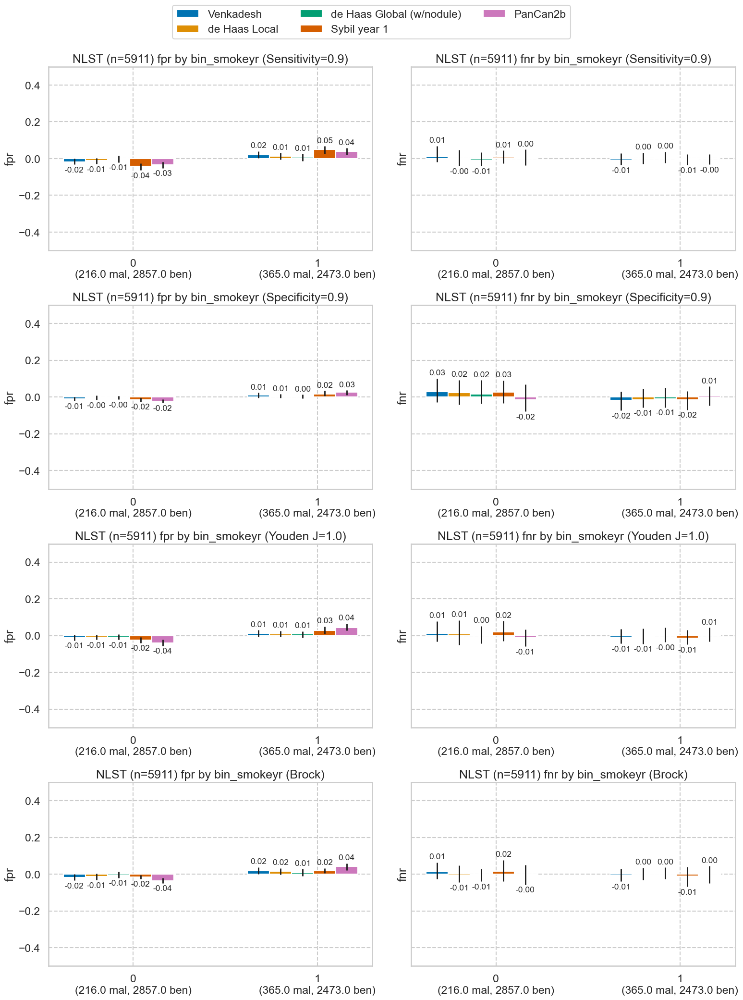

label                                                 pkyr  \
           count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                
0         3027.0  0.079617  0.270744  0.0  0.0  0.0  0.0  1.0  3027.0   
1         2884.0  0.117892  0.322536  0.0  0.0  0.0  0.0  1.0  2884.0   

                                                                
               mean        std    min   25%   50%   75%    max  
bin_pkyr                                                        
0         40.627800   5.760036  30.00  36.0  41.0  45.0   51.0  
1         76.879785  24.261537  51.25  60.0  70.0  87.5  260.0

### bin_pkyr

,num,pct,mal,ben,pct_mal
0,3027,51.209609,241,2786,7.961678
1,2884,48.790391,340,2544,11.789182


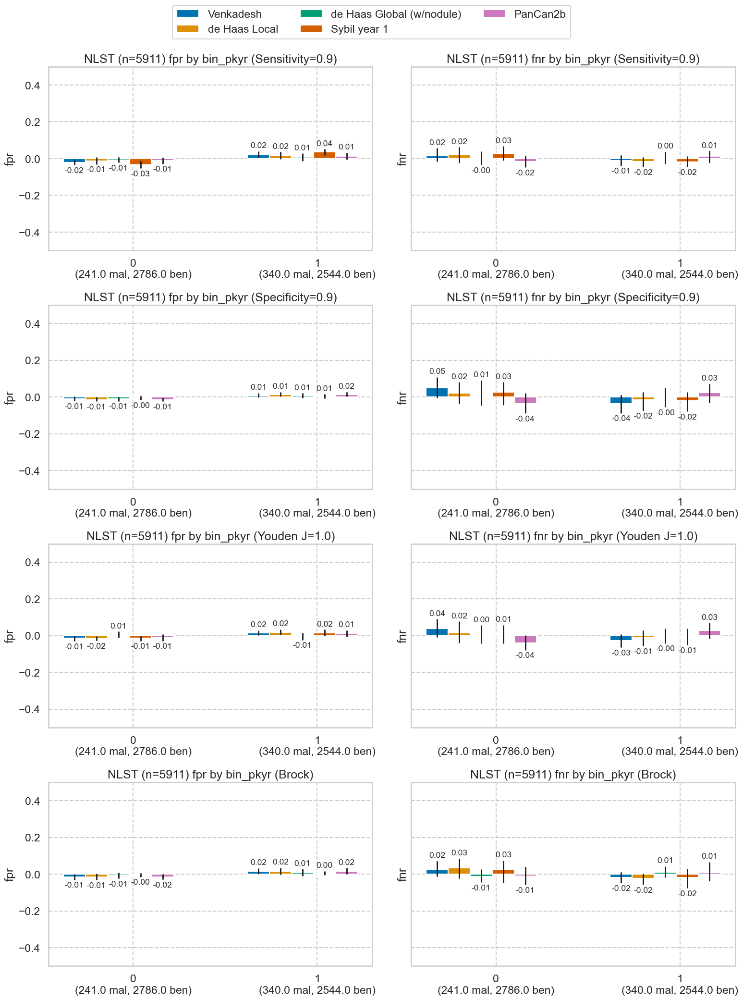

In [31]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, labels=False)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

#### Diameter [mm]

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,8.446379,5.104287,4.0,5.2,6.8,9.7,64.7
1,581.0,14.567642,9.611311,4.1,8.5,12.2,17.8,83.0


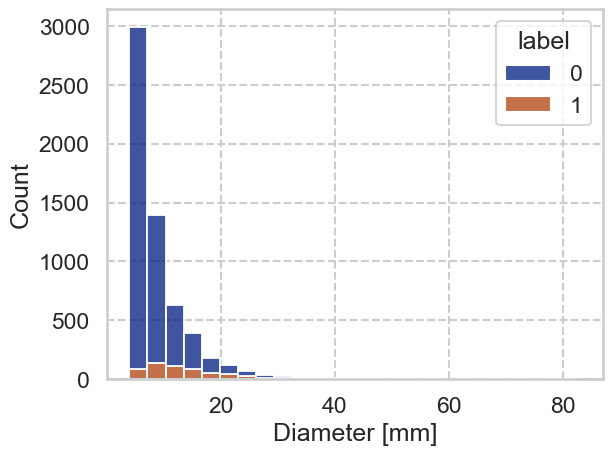

#### NoduleCounts

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,5330.0,1.857786,1.240176,1.0,1.0,1.0,2.0,11.0
1,581.0,2.287435,1.300529,1.0,1.0,2.0,3.0,11.0


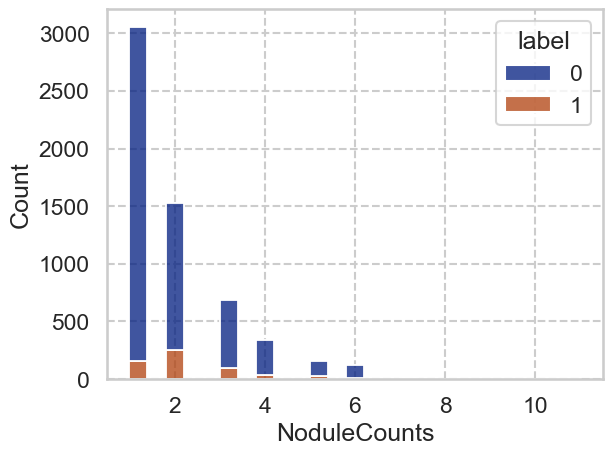

In [32]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_19036\3226706664.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())


label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                        
(0, 1]            3054.0  0.050753  0.219529  0.0  0.0  0.0  0.0  1.0   
(1, 12]           2857.0  0.149107  0.356257  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
(0, 1]                 3054.0  1.000000  0.000000  1.0  1.0  1.0  1.0   1.0  
(1, 12]                2857.0  2.862093  1.206261  2.0  2.0  2.0  3.0  11.0

### bin_NoduleCounts

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subgroups = df.groupby(cat)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utilities\threshold.py:155: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and

,num,pct,mal,ben,pct_mal
"(0, 1]",3054,51.666385,155,2899,5.075311
"(1, 12]",2857,48.333615,426,2431,14.910746


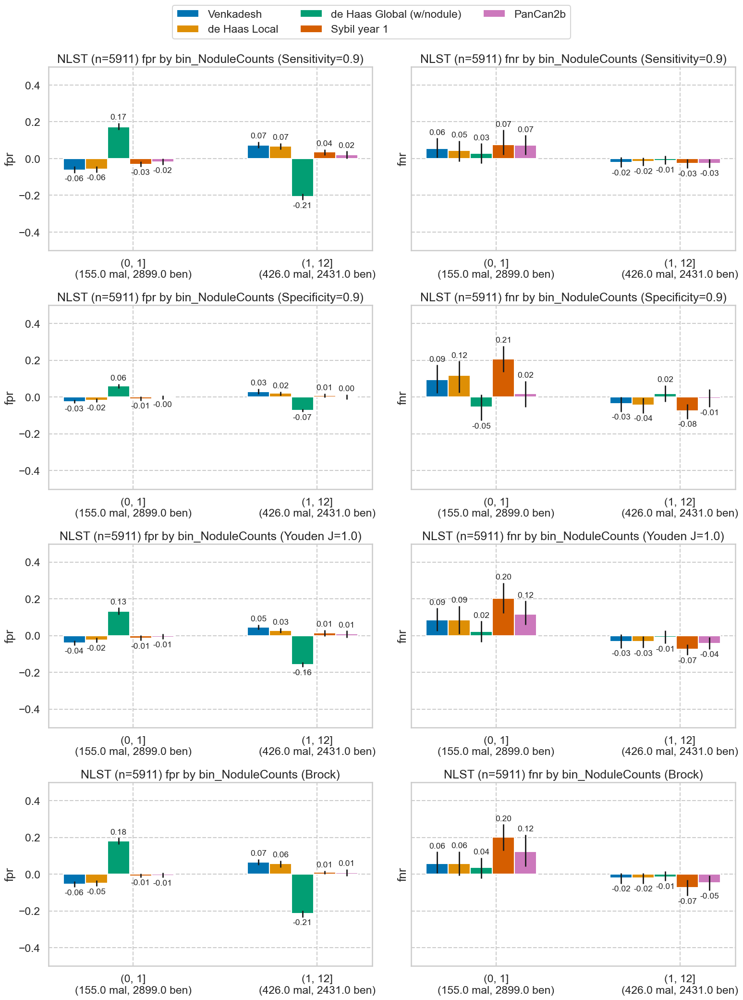

In [33]:
# for c in included_num_cols:
#     nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
#     display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
#     plot_by_category(nlst_preds, f'bin_{c}')
nlst_preds['bin_NoduleCounts'] = pd.cut(nlst_preds['NoduleCounts'], bins=[0, 1, 12], right=True)
display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())
plot_by_category(nlst_preds, f'bin_NoduleCounts')

label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                        
0                  2993.0  0.028065  0.165188  0.0  0.0  0.0  0.0  1.0   
1                  2918.0  0.170322  0.375980  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                             \
                          count       mean       std  min  25%   50%   75%   
bin_Diameter [mm]                                                            
0                        2993.0   5.437755  0.878854  4.0  4.7   5.4   6.2   
1                        2918.0  12.751131  6.694085  7.2  8.5  10.6  14.6   

                         
                    max  
bin_Diameter [mm]        
0                   7.1  
1                  83.0

### bin_Diameter [mm]

,num,pct,mal,ben,pct_mal
0,2993,50.63441,84,2909,2.806549
1,2918,49.36559,497,2421,17.032214


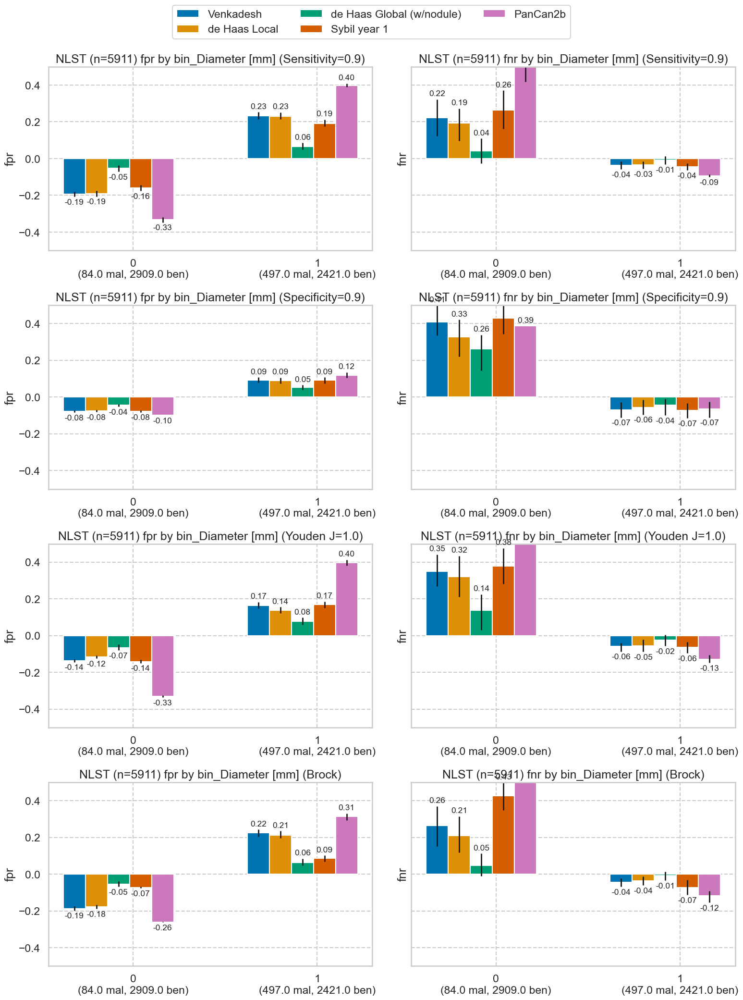

In [34]:
nlst_preds['bin_Diameter [mm]'] = pd.qcut(nlst_preds['Diameter [mm]'], q=2, labels=False)
display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())
plot_by_category(nlst_preds, f'bin_Diameter [mm]')